В данном задании Вам предстоит познакомиться с архитектурами *AlexNet*, *VGG* и *Inception* и для каждой из этих моделей использовать технику **Transfer Learning**.  

* **Transfer Learning** - это процесс дообучения на **новых данных** какой-либо нейросети, уже обученной до этого на других данных, обычно на каком-нибудь хорошем, большом (миллионы картинок) датасете (например, [ImageNet](http://www.image-net.org/) ~ 14 млн картинок).

<h2 style="text-align: center;"><b>AlexNet</b></h2>

**AlexNet** - нейронная сеть, которая победила в ILSVRC (соревнование по классификации картинок из ImageNet) в 2012 году и стала основой для многих других архитектур. Впервые она была представлена в статье  “ImageNet Classification with Deep Convolutional Neural Networks”, над которой работал Джоффри Хинтон - человек, которого многие называют отцом современного computer vision.

Архитектура описана на картинке ниже

<img src="https://www.learnopencv.com/wp-content/uploads/2018/05/AlexNet-1.png">

**AlexNet** состоит из 5 **сверточных** слоев, 3 **MaxPool** слоев и 2 **FullyConnected** слоев в конце. Обратите внимание, что в последнем пулинг слое окна, из которых берется максимум, пересекаются за счет того, что *stride*=2. Это изменение по сравнению с традиционным пулингом помогло снизить ошибку на 0.4%.

По сути **AlexNet** это самая базовая архитектура для сверточной сети после LeNet, которую мы уже писали на предыдущем занятии.

<h2 style="text-align: center;"><b>VGG</b></h3>

Один **сверточный** слой с фильтром 5$\times$5 можно заменить двумя подряд идущими слоями с фильтрами размером 3$\times$3, так как **воспринимаемая область** картинки у них будет одинаковой. При этом уменьшиться количество параметров, поэтому такую сеть будет легче обучать.

На момент создания VGG люди уже заметили, что чем больше слоев в нейросети, тем выше ее точность. Заменяя большие фильтры на несколько фильтров 3$\times$3 исследователи получили глубокую нейросеть с меньшим количеством параметров. Архитектура VGG-16 (версии VGG с 16 слоями) представлена на картинке ниже:


<img src="https://cdn-images-1.medium.com/max/1040/1*0Tk4JclhGOCR_uLe6RKvUQ.png">

Когда говорят **VGG**, то чаще всего имеют ввиду **VGG-16** или **VGG-19**. Более глубоких версий **VGG** нет, так как после 19 слоев точность начинает падать.

Чтобы добиться высоких результатов в соревновании при обучении и валидации нейросети использовались дополнительные премы, подробнее о которых можно прочитать в [статье на Medium](https://medium.com/coinmonks/paper-review-of-vggnet-1st-runner-up-of-ilsvlc-2014-image-classification-d02355543a11).


<h2 style="text-align: center;"><b>Inception v1</b></h3>

### Рассмотрим идею, которая подтолкнула исследователей к созданию этой архитектуры.

Площадь, которую занимает классифицируемый объект, может очень сильно отличаться. Пример на картинке ниже:

<img src="https://cdn-images-1.medium.com/max/1040/1*aBdPBGAeta-_AM4aEyqeTQ.jpeg">

* Для извлечения информации с большой площади лучше всего подходят **большие** фильтры, и наоборот для маленьких объектов лучше **маленькие** фильтры.
* Глубокие нейронные сети намного сложнее обучать: в них появляется проблема **затухания градиента** и они **переобучаются**.
Чтобы решить первую проблему исследователи придумали **Incepton** модуль, который применяет фильтры разного размера и затем склеивает полученные каналы. При этом извлекается как информация из больших объектов, так и из маленьких. Простейшая реализация модуля выглядит так:
<img src="https://cdn-images-1.medium.com/max/1040/1*DKjGRDd_lJeUfVlY50ojOA.png">

Реализацию можно сделать более эффективной, если сначала уменьшить количество каналов с помощью **сверточного слоя** 1$\times$1 и лишь затем применить **слой** с фильтрами 5$\times$5. Сокращение вычислений происходит за счет того, что мы сначала **уменьшаем размерность** данных и лишь затем преобразовываем их. Продвинутая реализация:
<img src="https://cdn-images-1.medium.com/max/1040/1*U_McJnp7Fnif-lw9iIC5Bw.png">

Сеть состоит из **корня** (нескольких сверточных слоев) и **Inception** модулей идущих за ним. Оранжевым прямоугольников выделен корень, а фиолетовыми - **вспомогательные классификаторы**. Именно они помогают бороться со второй проблемой, которую мы упомянули ранее. Наша функция потерь - взвешенная сумма **LogLoss** на двух **вспомогательных классификаторах** и **основном** в конце нейронной сети.
<img src="https://cdn-images-1.medium.com/max/1040/1*uW81y16b-ptBDV8SIT1beQ.png">

После Inception v1 были представлены 2, 3 и 4 версии, пррочитать о которых вы можете  в [статье на Medium](https://towardsdatascience.com/a-simple-guide-to-the-versions-of-the-inception-network-7fc52b863202).

Однако сейчас научились иначе бороться с затуханием градиентов с помощью **residual conncection**. Это позволило увеличить число слоев в нейронной сети.

![](https://i.imgur.com/XwcnU5x.png)

<h2 style="text-align: center;"><b>Transfer Learning</b></h3>

Теперь мы перейдем к тому, как можно использовать уже обученные нейросети, чтобы ускорить свою работу.

Давайте вспомним общую архитектуру CNN:

<img src="https://drive.google.com/uc?id=14pApKqQjnmWMXazY0HHjREn9rI9uwCQg">

Представим теперь, что eсть свой набор данных, и Вы хотите научить сеть классифицировать объекты из Вашей выборки.  


<h2 style="text-align: center;"><b>Реализация</b></h3>

<p style="text-align: center;"><i>(основано на http://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html)</i></p>

Мы будем пользоваться библиотекой PyTorch. Если Вы её ещё не установили, то вот [инструкция на Wiki по установке PyTorch](https://github.com/deepmipt/dlschl/wiki/%D0%98%D0%BD%D1%81%D1%82%D1%80%D1%83%D0%BA%D1%86%D0%B8%D1%8F-%D0%BF%D0%BE-%D1%83%D1%81%D1%82%D0%B0%D0%BD%D0%BE%D0%B2%D0%BA%D0%B5-PyTorch).

In [ ]:
!pip install -q torchvision catalyst

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 2.0 MB/s eta 0:00:00
Requested catalyst from https://files.pythonhosted.org/packages/05/09/36a4acd1c3112f2e2da74f4340778100a205ecb59166be00dc6287f3364f/catalyst-22.4-py2.py3-none-any.whl has invalid metadata: Expected matching RIGHT_PARENTHESIS for LEFT_PARENTHESIS, after version specifier
    scikit-image (<0.19.0>=0.16.1) ; extra == 'all'
                 ~~~~~~~~^
Please use pip<24.1 if you need to use this version.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 kB 2.5 MB/s eta 0:00:00
Requested catalyst from https://files.pythonhosted.org/packages/28/4f/380899b95b45f02182e7163b4e9be4749724c898886d70009168bfd07409/catalyst-22.2.1-py2.py3-none-any.whl has invalid metadata: Expected matching RIGHT_PARENTHESIS for LEFT_PARENTHESIS, after version specifier
    scikit-image (<0.19.0>=0.16.1) ; extra == 'all'
                 ~~~~~~~~^
Please use pip<24.1 if you need to use this version.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import time
import os

### В чём состоит задание

Вам предстоит попробовать использовать  типа архитектур свёрточных нейросетей - **AlexNet (сделано за Вас в примере), VGG16, Inception_v3** - как *Feature Extractor*, с помощью *Fine Tuning* и *"из коробки"*.

**Для каждого пункта нужно:**
- вывести график loss'а на обучающей и на валидационной выборке
- вывести качество модели (accuracy)

### Данные  

В данном задании используются сети (из библиотеки **torchvision**), предобученные на датасете ImageNet.  
В качестве новых данных будет датасет Меравьи vs Пчёлы, Вам нужно скачать его отсюда: **[Муравьи vs Пчёлы](https://download.pytorch.org/tutorial/hymenoptera_data.zip)**, *являющийся частью датасета ImageNet*. В нём 400 картинок, ~250 обучение и ~150 валидация (тест).

### Функции для отрисовки и обучения модели:

* Загрузим данные:

In [ ]:
!wget https://download.pytorch.org/tutorial/hymenoptera_data.zip
!unzip hymenoptera_data.zip

--2025-11-29 11:53:39--  https://download.pytorch.org/tutorial/hymenoptera_data.zip
Resolving download.pytorch.org (download.pytorch.org)... 52.85.129.88, 52.85.129.24, 52.85.129.123, ...
Connecting to download.pytorch.org (download.pytorch.org)|52.85.129.88|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47286322 (45M) [application/zip]
Saving to: ‘hymenoptera_data.zip’

hymenoptera_data.zi 100%[===================>]  45.10M   197MB/s    in 0.2s    

2025-11-29 11:53:39 (197 MB/s) - ‘hymenoptera_data.zip’ saved [47286322/47286322]

Archive:  hymenoptera_data.zip
   creating: hymenoptera_data/
   creating: hymenoptera_data/train/
   creating: hymenoptera_data/train/ants/
  inflating: hymenoptera_data/train/ants/0013035.jpg  
  inflating: hymenoptera_data/train/ants/1030023514_aad5c608f9.jpg  
  inflating: hymenoptera_data/train/ants/1095476100_3906d8afde.jpg  
  inflating: hymenoptera_data/train/ants/1099452230_d1949d3250.jpg  
  inflating: hymenoptera_data/tr

In [ ]:
# Преобразование обучающих данных для расширения обучающей выборки и её нормализация
# Для валидационной (тестовой) выборки только нормализация
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(244),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(244),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
# папка с данными. Если запускаете в колабе, нужно скопировать данные к себе в директорию и примонтировать диск. Если запускаете локально -- просто скачайте данные
data_dir = './hymenoptera_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
# специальный класс для загрузки данных в виде батчей

train_dataloader = torch.utils.data.DataLoader(
    image_datasets["train"], batch_size=32,
    shuffle=True
)
val_dataloader = torch.utils.data.DataLoader(
    image_datasets["val"], batch_size=128
)

loaders = {
    "train": train_dataloader,
    "valid": val_dataloader
}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

Размеры обучающей и валидационной выборок:

In [ ]:
print(dataset_sizes)

{'train': 244, 'val': 153}


**Вопрос (на понимание кода выше):**  
1. В DataLoader() выше стоит "shuffle=True". Для чего это нужно?
2. Сколько картинок будет в каждом батче?

**Ответ:**
1. для улучшения сходимости модели и снижения риска переобучения. Не нужно запоминать последовательность образцов
2. train - 32 картинки на batch
val - 128 картинки на batch

* Посмотрим на картинки из датасета:

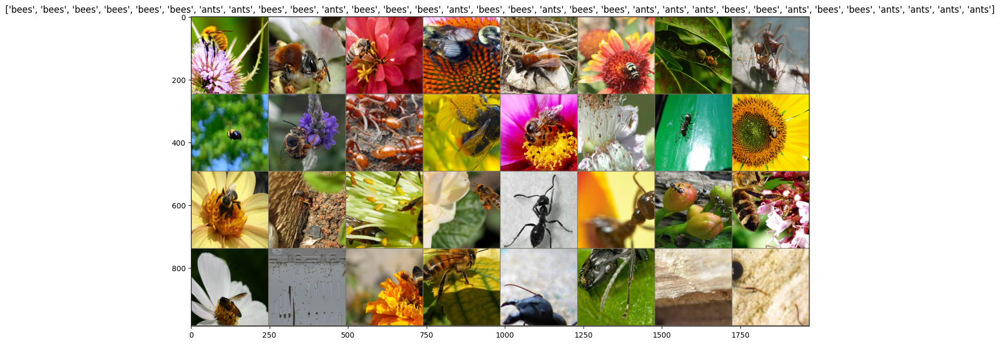

In [ ]:
from matplotlib import pyplot as plt

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)


inputs, classes = next(iter(loaders['train']))

out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [ ]:
image_datasets["train"][0]

(tensor([[[-0.6623, -0.6794, -0.6623,  ..., -0.7993, -0.7993, -0.7650],
          [-0.6623, -0.6452, -0.6794,  ..., -0.7822, -0.7479, -0.7308],
          [-0.6452, -0.6623, -0.6965,  ..., -0.7479, -0.7479, -0.7650],
          ...,
          [-0.5938, -0.5938, -0.5938,  ..., -0.6452, -0.6623, -0.6794],
          [-0.6109, -0.6109, -0.6109,  ..., -0.6452, -0.6623, -0.6623],
          [-0.6109, -0.6281, -0.6452,  ..., -0.6623, -0.6623, -0.6281]],
 
         [[ 0.6429,  0.6254,  0.6429,  ...,  0.5553,  0.5553,  0.5728],
          [ 0.6429,  0.6604,  0.6429,  ...,  0.5378,  0.5728,  0.5903],
          [ 0.6604,  0.6429,  0.6429,  ...,  0.5553,  0.5553,  0.5378],
          ...,
          [ 0.7654,  0.7654,  0.7654,  ...,  0.7129,  0.6954,  0.6779],
          [ 0.7479,  0.7479,  0.7479,  ...,  0.7129,  0.6954,  0.6954],
          [ 0.7479,  0.7304,  0.7129,  ...,  0.6954,  0.6954,  0.7304]],
 
         [[ 2.2740,  2.2566,  2.2740,  ...,  2.2043,  2.2043,  2.2740],
          [ 2.3088,  2.3088,

### Обучение моделей

Следующая функция будет использоваться для обучения модели. Аргументы:  
* model $-$ нейросеть
* loss $-$ оптимизируемая функция (criterion, cost function, objective)
* optimizer $-$ оптимизационный алгоритм
* scheduler $-$ политика изменения learning_rate
* num_epochs $-$ количество итераций обучения

In [ ]:
from catalyst import dl, metrics

class ImgRunner(dl.Runner):

    def predict_batch(self, batch):
        # model inference step
        return self.model(batch[0].to(self.device).view(batch[0].size(0), -1))

    def _handle_batch(self, batch):
        # model train/valid step
        x, y = batch
        self.input = {"targets": y}
        y_hat = self.model(x)
        self.output = {"logits": y_hat}

### Задание

Для каждой из следующих нейросетей:
* **AlexNet** (уже сделано в примере)
* **VGG16**
* **Inception_v3**

Напишите код и выведите результат (график лосса, accuracy и вывод примера классификации картинок с визализацией (с помощью функции `vizualize_model()`)) для трёх способов:
* Использование готовой нейросети **"из коробки"**
* Использование нейросети как **Feature Extractor**
* **Fine Tuning** нейросети

Для каждого пункта нужно:
* сделать с сетью то, что нужно в пункте ("из коробки", FE или FT)
* вывести график loss'а на обучающей и на валидационной выборке
* вывести качество модели (accuracy) на валидационной (тестовой) выборке
* (по желанию) использовать функцию visualize_model()

### AlexNet

*ПРИМЕЧАНИЕ: Здесь не выведены графики loss'а и не использована visualize_model(). От Вас это ожидается.*

Загрузка модели:

In [ ]:
model = models.alexnet(pretrained=True)

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth


Посмотрим, что внутри:

In [ ]:
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Видим, что на вход классификатору (classifier) подаётся *9216 признаков*. Это и будет размер входа для нашего нового классификатора.

* **Fine Tuning** способ

Сконфигурируем - изменим FC-слой и зададим *cost function* и *оптимизирующий алгоритм*:

(*по умолчанию backpropagation распространяется на все слои, поэтому здесь мы только заменяем FC-слой на свой классификатор*)

In [ ]:
!rm -rf logs

In [ ]:
# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 4096
# Заменяем Fully-Connected слой на наш линейный классификатор
model.classifier[6] = nn.Linear(num_features, 2)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir logs

In [ ]:
runner = ImgRunner()
runner.train(
    model=model,
    optimizer=optimizer,
    criterion=nn.CrossEntropyLoss(),
    callbacks=[
        dl.CriterionCallback(),
        dl.OptimizerCallback(),
        dl.AccuracyCallback()
    ],
    loaders=loaders,
    num_epochs=10,
    verbose=True,
    main_metric="accuracy01",
    minimize_metric=False,
    logdir="logs/alexnet"
)

1/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.35it/s, accuracy01=0.750, loss=0.544]
1/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.39it/s, accuracy01=0.880, loss=0.390]
[2020-11-15 10:05:06,395] 
1/10 * Epoch 1 (_base): lr=0.0001 | momentum=0.9000
1/10 * Epoch 1 (train): accuracy01=0.7090 | loss=0.5795
1/10 * Epoch 1 (valid): accuracy01=0.8954 | loss=0.3100
2/10 * Epoch (train): 100% 8/8 [00:06<00:00,  1.26it/s, accuracy01=0.700, loss=0.530]
2/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.38it/s, accuracy01=0.960, loss=0.171]
[2020-11-15 10:05:51,581] 
2/10 * Epoch 2 (_base): lr=0.0001 | momentum=0.9000
2/10 * Epoch 2 (train): accuracy01=0.8525 | loss=0.3369
2/10 * Epoch 2 (valid): accuracy01=0.8758 | loss=0.3095
3/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.54it/s, accuracy01=0.900, loss=0.228]
3/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.39it/s, accuracy01=1.000, loss=0.044]
[2020-11-15 10:06:32,818] 
3/10 * Epoch 3 (_base): lr=0.0001 | momentum=0.9000
3/10 * Epoch 3 (train):

* **Feature Extractor** способ:

In [ ]:
model_extractor = models.alexnet(pretrained=True)

Помним, что по-умолчанию все слои нейросети обучаются заново:

In [ ]:
for param in model_extractor.parameters():
    print(param.requires_grad)
    break

True


Сделаем так, чтобы на них *не распространялся backpropagation* (заморозим их), и подменим классификатор (ведь старый уже с весами для ImageNet'а).

In [ ]:
# замораживаем параметры (веса)
for param in model_extractor.parameters():
    param.requires_grad = False

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 4096
# Заменяем Fully-Connected слой на наш линейный классификатор
model_extractor.classifier[6] = nn.Linear(num_features, 2)

# Обучаем только классификатор
optimizer = optim.Adam(model_extractor.classifier[6].parameters(), lr=1e-4)

In [ ]:
runner = ImgRunner()

runner.train(
    model=model_extractor,
    optimizer=optimizer,
    criterion=nn.CrossEntropyLoss(),
    callbacks=[
        dl.CriterionCallback(),
        dl.OptimizerCallback(),
        dl.AccuracyCallback()
    ],
    loaders=loaders,
    num_epochs=10,
    verbose=True,
    main_metric="accuracy01",
    minimize_metric=False,
    logdir="logs/alexnet_freeze"
)

1/10 * Epoch (train): 100% 8/8 [00:01<00:00,  4.40it/s, accuracy01=0.600, loss=0.601]
1/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.41it/s, accuracy01=0.320, loss=0.810]
[2020-11-15 10:13:32,156] 
1/10 * Epoch 1 (_base): lr=0.0001 | momentum=0.9000
1/10 * Epoch 1 (train): accuracy01=0.5369 | loss=0.7545
1/10 * Epoch 1 (valid): accuracy01=0.4967 | loss=0.6894
2/10 * Epoch (train): 100% 8/8 [00:01<00:00,  4.29it/s, accuracy01=0.800, loss=0.431]
2/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.39it/s, accuracy01=0.760, loss=0.555]
[2020-11-15 10:14:00,725] 
2/10 * Epoch 2 (_base): lr=0.0001 | momentum=0.9000
2/10 * Epoch 2 (train): accuracy01=0.7377 | loss=0.5421
2/10 * Epoch 2 (valid): accuracy01=0.7582 | loss=0.5366
3/10 * Epoch (train): 100% 8/8 [00:01<00:00,  4.32it/s, accuracy01=0.950, loss=0.438]
3/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.38it/s, accuracy01=0.840, loss=0.467]
[2020-11-15 10:14:35,471] 
3/10 * Epoch 3 (_base): lr=0.0001 | momentum=0.9000
3/10 * Epoch 3 (train):

* **Смешанный** способ:
Мы будем обучать не только последний **fully connected** слой, но и несколько предпоследних

In [ ]:
model_mixed = models.alexnet(pretrained=True)

In [ ]:
model_mixed

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
from itertools import chain

layers_to_unfreeze = 5

# Выключаем подсчет градиентов для слоев, которые не будем обучать
for param in model_mixed.features[:-layers_to_unfreeze].parameters():
    param.requires_grad = False

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 4096
# Заменяем Fully-Connected слой на наш линейный классификатор
model_mixed.classifier[6] = nn.Linear(num_features, 2)

# Обучаем последние layers_to_unfreeze слоев из сверточной части и fully connected слой
# parameters() возвращает просто список тензоров парамтеров, поэтому два таких списка можно сложить
optimizer = torch.optim.Adam(
    chain(
        list(model_mixed.features.parameters())[-layers_to_unfreeze:],
        model_mixed.classifier.parameters()
    ),
    lr=1e-4,
)

In [ ]:
runner = ImgRunner()

runner.train(
    model=model_mixed,
    optimizer=optimizer,
    criterion=nn.CrossEntropyLoss(),
    callbacks=[
        dl.CriterionCallback(),
        dl.OptimizerCallback(),
        dl.AccuracyCallback()
    ],
    loaders=loaders,
    num_epochs=10,
    verbose=True,
    main_metric="accuracy01",
    minimize_metric=False,
    logdir="logs/alexnet_mixed"
)

1/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.80it/s, accuracy01=0.900, loss=0.315]
1/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.39it/s, accuracy01=0.840, loss=0.496]
[2020-11-15 10:18:44,828] 
1/10 * Epoch 1 (_base): lr=0.0001 | momentum=0.9000
1/10 * Epoch 1 (train): accuracy01=0.7459 | loss=0.5176
1/10 * Epoch 1 (valid): accuracy01=0.8758 | loss=0.3102
2/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.69it/s, accuracy01=0.900, loss=0.171]
2/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.43it/s, accuracy01=0.880, loss=0.346]
[2020-11-15 10:19:48,384] 
2/10 * Epoch 2 (_base): lr=0.0001 | momentum=0.9000
2/10 * Epoch 2 (train): accuracy01=0.9057 | loss=0.2514
2/10 * Epoch 2 (valid): accuracy01=0.8954 | loss=0.3397
3/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.81it/s, accuracy01=0.850, loss=0.204]
3/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.45it/s, accuracy01=0.880, loss=0.280]
[2020-11-15 10:20:57,785] 
3/10 * Epoch 3 (_base): lr=0.0001 | momentum=0.9000
3/10 * Epoch 3 (train):

### Бонус

Существует еще один интересный способ. Мы не хотим, чтобы ядра в свертках сильно менялись во время обучения, а еще мы знаем, что чем меньше lr, тем меньше изменения. Давайте уменьшим lr на feature extractor-е! Разберемся как это сделать...

In [ ]:
model_mixed_lr = models.alexnet(pretrained=True)

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 4096
# Заменяем Fully-Connected слой на наш линейный классификатор
model_mixed.classifier[6] = nn.Linear(num_features, 2)


In [ ]:
optimizer = torch.optim.Adam(
    (
        {
            "params": model_mixed_lr.features.parameters(),
            "lr": 1e-6,
        },
        {
            "params": model_mixed_lr.classifier.parameters(),
        }
     ),
     lr=1e-4
)

In [ ]:
runner = ImgRunner()

runner.train(
    model=model_mixed_lr,
    optimizer=optimizer,
    criterion=nn.CrossEntropyLoss(),
    callbacks=[
        dl.CriterionCallback(),
        dl.OptimizerCallback(),
        dl.AccuracyCallback()
    ],
    loaders=loaders,
    num_epochs=10,
    verbose=True,
    main_metric="accuracy01",
    minimize_metric=False,
    logdir="logs/alexnet_mixed_lr"
)

1/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.58it/s, accuracy01=0.450, loss=2.791]
1/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.38it/s, accuracy01=0.840, loss=0.655]
[2020-11-15 10:27:51,282] 
1/10 * Epoch 1 (_base): lr=1.000e-06 | momentum=0.9000
1/10 * Epoch 1 (train): accuracy01=0.1680 | loss=7.5550
1/10 * Epoch 1 (valid): accuracy01=0.6601 | loss=1.5137
2/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.46it/s, accuracy01=0.900, loss=0.456]
2/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.43it/s, accuracy01=0.720, loss=1.557]
[2020-11-15 10:28:59,994] 
2/10 * Epoch 2 (_base): lr=1.000e-06 | momentum=0.9000
2/10 * Epoch 2 (train): accuracy01=0.8033 | loss=0.7463
2/10 * Epoch 2 (valid): accuracy01=0.8366 | loss=0.6349
3/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.41it/s, accuracy01=0.850, loss=0.287]
3/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.33it/s, accuracy01=0.880, loss=0.574]
[2020-11-15 10:30:11,650] 
3/10 * Epoch 3 (_base): lr=1.000e-06 | momentum=0.9000
3/10 * Epoch 3

### Другие, более современные нейросети

### ResNet 18

In [ ]:
models.resnet18(pretrained=True)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# Ваш код здесь
model_extractor = models.resnet18(pretrained=True)

# замораживаем параметры (веса)
for param in model_extractor.parameters():
    param.requires_grad = False

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 512
# Заменяем Fully-Connected слой на наш линейный классификатор
model_extractor.fc = nn.Linear(num_features, 2)

# Обучаем только классификатор
optimizer = optim.Adam(model_extractor.fc.parameters(), lr=1e-3)

In [ ]:
runner = ImgRunner()

runner.train(
    model=model_extractor,
    optimizer=optimizer,
    criterion=nn.CrossEntropyLoss(),
    callbacks=[
        dl.CriterionCallback(),
        dl.OptimizerCallback(),
        dl.AccuracyCallback()
    ],
    loaders=loaders,
    num_epochs=10,
    verbose=True,
    main_metric="accuracy01",
    minimize_metric=False,
    logdir="logs/resnet",
    load_best_on_end=True,
)

1/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.35it/s, accuracy01=0.650, loss=0.608]
1/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.21it/s, accuracy01=0.960, loss=0.427]
[2020-11-15 10:37:34,476] 
1/10 * Epoch 1 (_base): lr=0.0010 | momentum=0.9000
1/10 * Epoch 1 (train): accuracy01=0.5984 | loss=0.6645
1/10 * Epoch 1 (valid): accuracy01=0.7843 | loss=0.5094
2/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.58it/s, accuracy01=1.000, loss=0.401]
2/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.21it/s, accuracy01=0.680, loss=0.583]
[2020-11-15 10:37:38,990] 
2/10 * Epoch 2 (_base): lr=0.0010 | momentum=0.9000
2/10 * Epoch 2 (train): accuracy01=0.8033 | loss=0.5088
2/10 * Epoch 2 (valid): accuracy01=0.8693 | loss=0.4132
3/10 * Epoch (train): 100% 8/8 [00:02<00:00,  3.55it/s, accuracy01=0.850, loss=0.372]
3/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.17it/s, accuracy01=0.880, loss=0.343]
[2020-11-15 10:37:45,039] 
3/10 * Epoch 3 (_base): lr=0.0010 | momentum=0.9000
3/10 * Epoch 3 (train):

In [ ]:
# замораживаем параметры (веса)
for param in model_extractor.parameters():
    param.requires_grad = True

optimizer = optim.Adam(model_extractor.parameters(), lr=1e-4)

runner = ImgRunner()

runner.train(
    model=model_extractor,
    optimizer=optimizer,
    criterion=nn.CrossEntropyLoss(),
    callbacks=[
        dl.CriterionCallback(),
        dl.OptimizerCallback(),
        dl.AccuracyCallback()
    ],
    loaders=loaders,
    num_epochs=10,
    verbose=True,
    main_metric="accuracy01",
    minimize_metric=False,
    logdir="logs/resnet_step2",
    load_best_on_end=True,
)

1/10 * Epoch (train): 100% 8/8 [00:02<00:00,  2.81it/s, accuracy01=0.900, loss=0.254]
1/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.24it/s, accuracy01=0.880, loss=0.349]
[2020-11-15 10:38:33,420] 
1/10 * Epoch 1 (_base): lr=0.0001 | momentum=0.9000
1/10 * Epoch 1 (train): accuracy01=0.9098 | loss=0.2236
1/10 * Epoch 1 (valid): accuracy01=0.9412 | loss=0.2039
2/10 * Epoch (train): 100% 8/8 [00:02<00:00,  2.73it/s, accuracy01=1.000, loss=0.058]
2/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.17it/s, accuracy01=0.880, loss=0.316]
[2020-11-15 10:38:43,453] 
2/10 * Epoch 2 (_base): lr=0.0001 | momentum=0.9000
2/10 * Epoch 2 (train): accuracy01=0.9590 | loss=0.1015
2/10 * Epoch 2 (valid): accuracy01=0.9346 | loss=0.2288
3/10 * Epoch (train): 100% 8/8 [00:02<00:00,  2.74it/s, accuracy01=0.950, loss=0.134]
3/10 * Epoch (valid): 100% 2/2 [00:01<00:00,  1.23it/s, accuracy01=0.880, loss=0.577]
[2020-11-15 10:38:53,160] 
3/10 * Epoch 3 (_base): lr=0.0001 | momentum=0.9000
3/10 * Epoch 3 (train):

In [ ]:
# Feature Extraction
# заморожены слои предобученной, обучаем классификатор
# небольшое кол-во параметров, быстрее динамика обучения
# Fine-tuning
# заморожены начальные слои
# обучаются конечные слои и классификатор
# баланс скорость/качество

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import time
import os
from matplotlib import pyplot as plt

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

def visualize_model(model, dataloader, class_names, num_images=6):
    device = next(model.parameters()).device
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(15, 10))

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}, true: {class_names[labels[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    plt.show()
                    return
        plt.show()

class ImgRunner:
    def __init__(self):
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def train(self, model, optimizer, criterion, loaders, num_epochs=10):
        model = model.to(self.device)
        self.model = model
        self.optimizer = optimizer
        self.criterion = criterion

        train_losses = []
        val_losses = []
        train_accs = []
        val_accs = []

        for epoch in range(num_epochs):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()
                else:
                    model.eval()

                running_loss = 0.0
                running_corrects = 0

                for inputs, labels in loaders[phase]:
                    inputs = inputs.to(self.device)
                    labels = labels.to(self.device)

                    self.optimizer.zero_grad()

                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = self.criterion(outputs, labels)

                        if phase == 'train':
                            loss.backward()
                            self.optimizer.step()

                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                epoch_loss = running_loss / len(loaders[phase].dataset)
                epoch_acc = running_corrects.double() / len(loaders[phase].dataset)

                if phase == 'train':
                    train_losses.append(epoch_loss)
                    train_accs.append(epoch_acc.item())
                else:
                    val_losses.append(epoch_loss)
                    val_accs.append(epoch_acc.item())

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            print()

        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, label='Train Loss')
        plt.plot(val_losses, label='Val Loss')
        plt.legend()
        plt.title('Loss')

        plt.subplot(1, 2, 2)
        plt.plot(train_accs, label='Train Acc')
        plt.plot(val_accs, label='Val Acc')
        plt.legend()
        plt.title('Accuracy')
        plt.show()

        return model

data_transforms_vgg = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = './hymenoptera_data'
image_datasets_vgg = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms_vgg[x])
                  for x in ['train', 'val']}

dataloaders_vgg = {
    'train': torch.utils.data.DataLoader(image_datasets_vgg['train'], batch_size=32, shuffle=True),
    'val': torch.utils.data.DataLoader(image_datasets_vgg['val'], batch_size=128)
}

class_names = image_datasets_vgg['train'].classes
dataset_sizes = {x: len(image_datasets_vgg[x]) for x in ['train', 'val']}

print(f"Dataset sizes: {dataset_sizes}")
print(f"Class names: {class_names}")

print("VGG16 Full Training")
model_vgg = models.vgg16(pretrained=True)

num_features = model_vgg.classifier[6].in_features
num_features

model_vgg = models.vgg16(pretrained=True)
print("Original classifier:")
print(model_vgg.classifier)

num_features = model_vgg.classifier[6].in_features
print(f"\nNumber of input features for last layer: {num_features}")
print(f"Number of classes: {len(class_names)}")

model_vgg.classifier[6] = nn.Linear(num_features, len(class_names))
print("\nModified classifier:")
print(model_vgg.classifier)
print(f"Last layer: {model_vgg.classifier[6]}")
print(f"Last layer weight shape: {model_vgg.classifier[6].weight.shape}")
print(f"Last layer bias shape: {model_vgg.classifier[6].bias.shape}")

print(f"\nLast layer has {model_vgg.classifier[6].out_features} neurons = {len(class_names)} classes")

Dataset sizes: {'train': 244, 'val': 153}
Class names: ['ants', 'bees']
VGG16 Full Training


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:05<00:00, 95.1MB/s]


Original classifier:
Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)

Number of input features for last layer: 4096
Number of classes: 2

Modified classifier:
Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=2, bias=True)
)
Last layer: Linear(in_features=4096, out_features=2, bias=True)
Last layer weight shape: torch.Size([2, 4096])
Last layer bias shape: torch.Size([2])

Last layer has 2 neurons = 2 classes


Dataset sizes: {'train': 244, 'val': 153}
Class names: ['ants', 'bees']
VGG16 Full Training
Epoch 0/9
----------
train Loss: 0.4905 Acc: 0.7664
val Loss: 0.2994 Acc: 0.9216

Epoch 1/9
----------
train Loss: 0.2538 Acc: 0.9016
val Loss: 0.2316 Acc: 0.9346

Epoch 2/9
----------
train Loss: 0.2183 Acc: 0.9139
val Loss: 0.2701 Acc: 0.8889

Epoch 3/9
----------
train Loss: 0.1501 Acc: 0.9221
val Loss: 0.3006 Acc: 0.9020

Epoch 4/9
----------
train Loss: 0.0815 Acc: 0.9672
val Loss: 0.2876 Acc: 0.9216

Epoch 5/9
----------
train Loss: 0.0776 Acc: 0.9631
val Loss: 0.4420 Acc: 0.9216

Epoch 6/9
----------
train Loss: 0.0985 Acc: 0.9590
val Loss: 0.3080 Acc: 0.9281

Epoch 7/9
----------
train Loss: 0.0902 Acc: 0.9549
val Loss: 0.3436 Acc: 0.9085

Epoch 8/9
----------
train Loss: 0.1832 Acc: 0.9426
val Loss: 0.3113 Acc: 0.9020

Epoch 9/9
----------
train Loss: 0.1637 Acc: 0.9303
val Loss: 0.3561 Acc: 0.9020



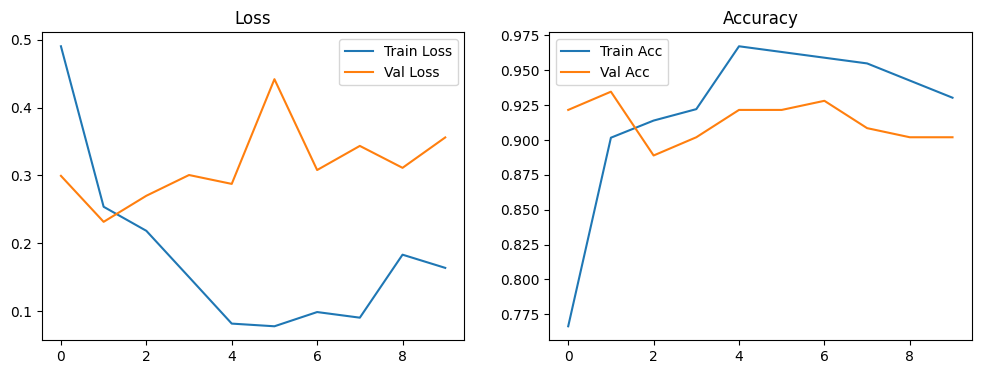

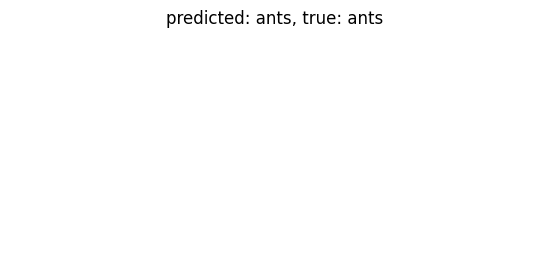

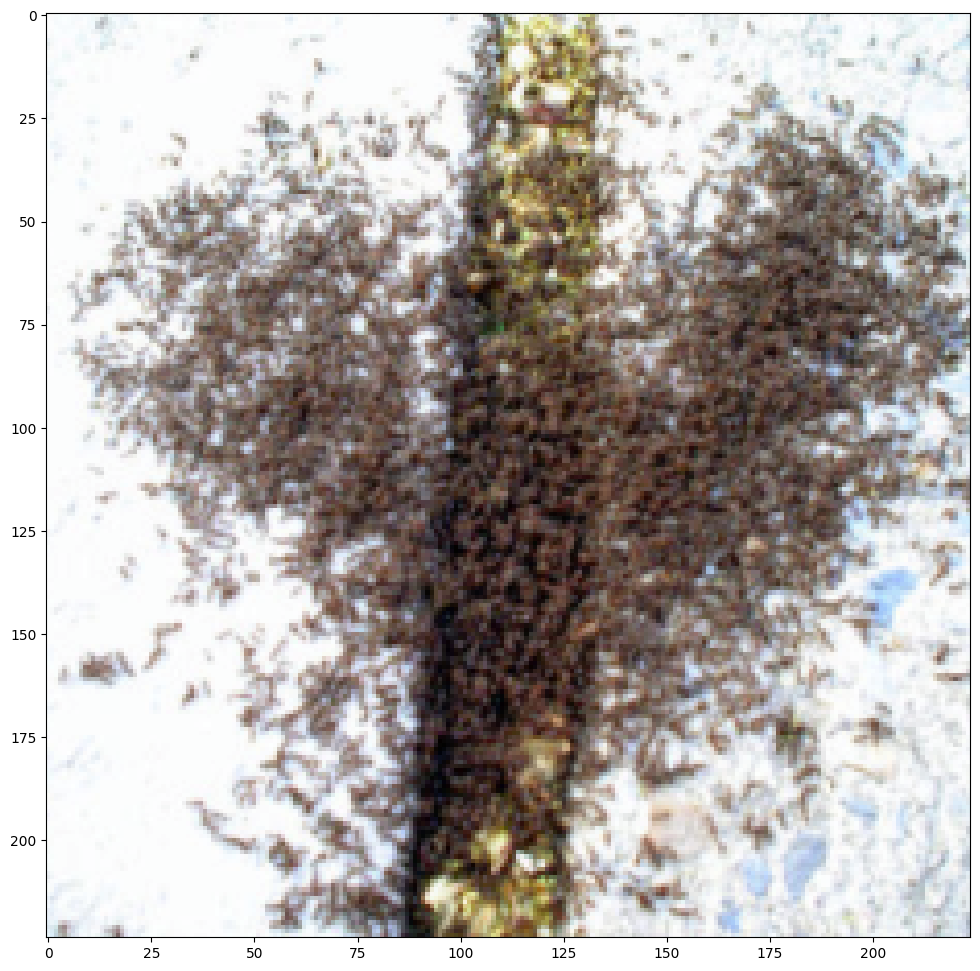

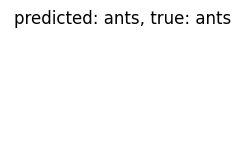

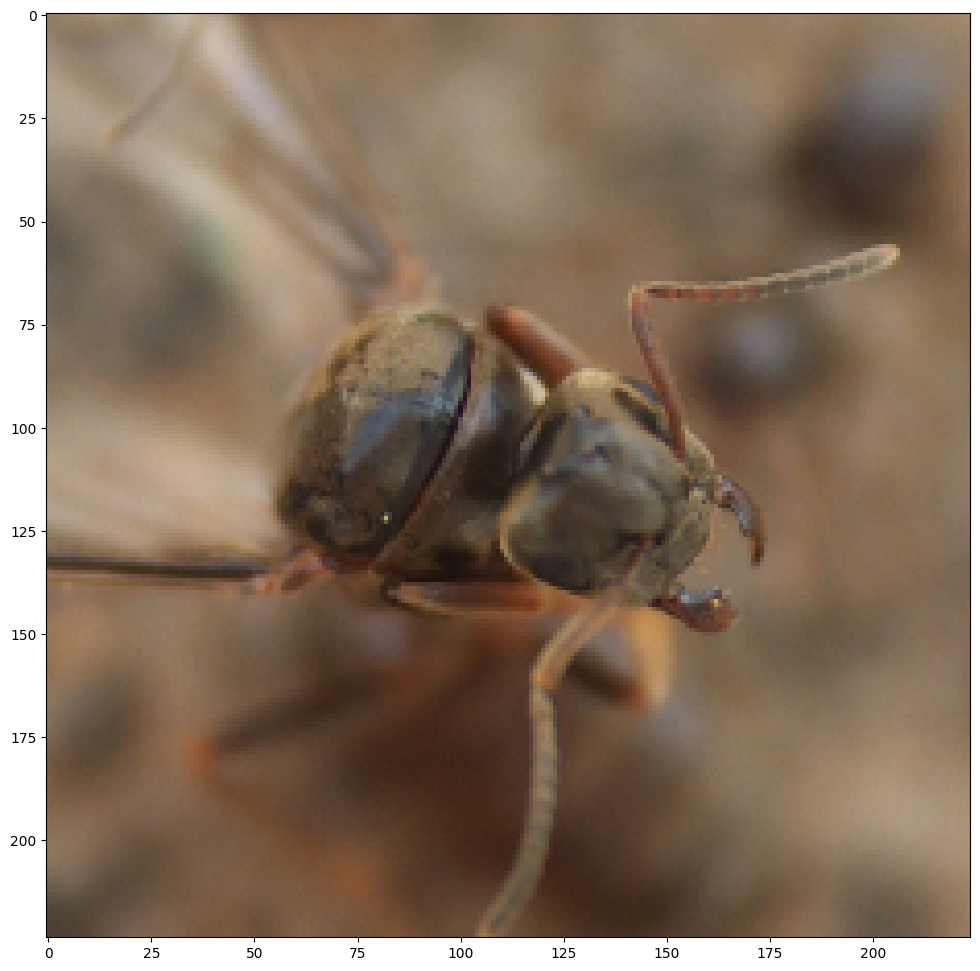

...

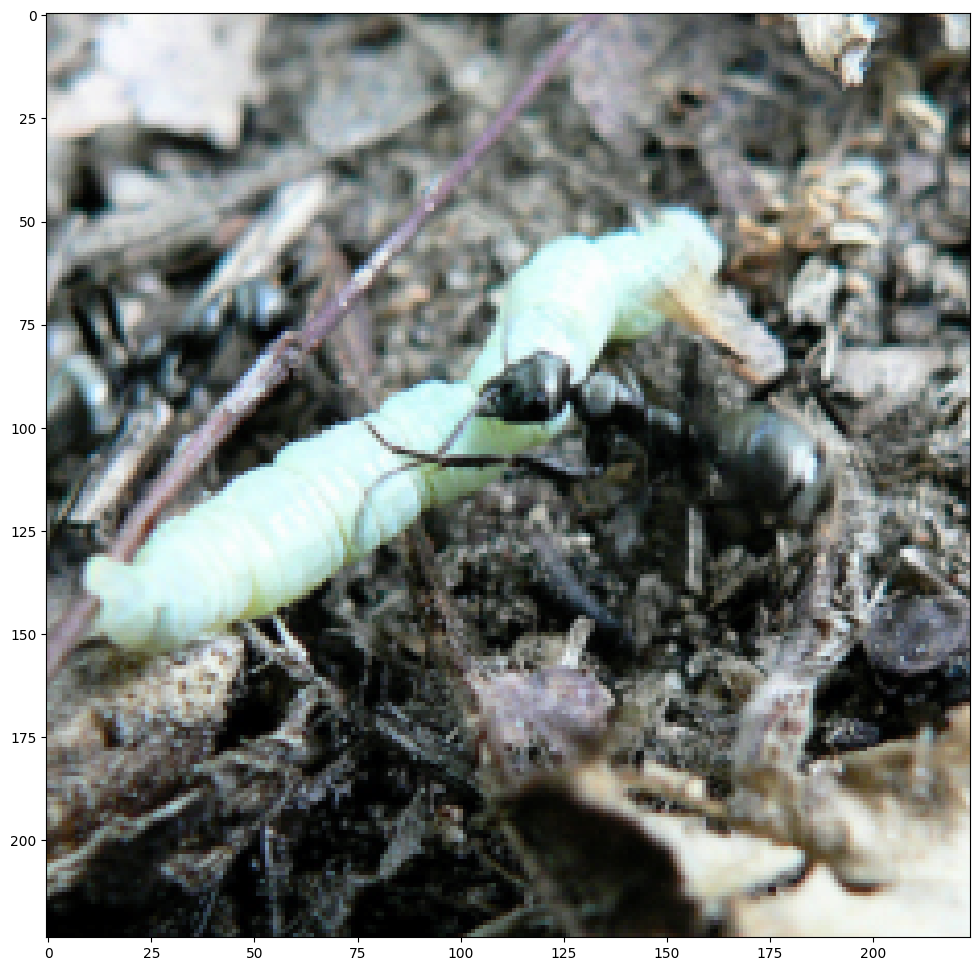

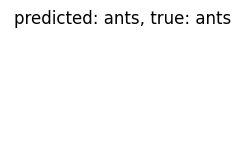

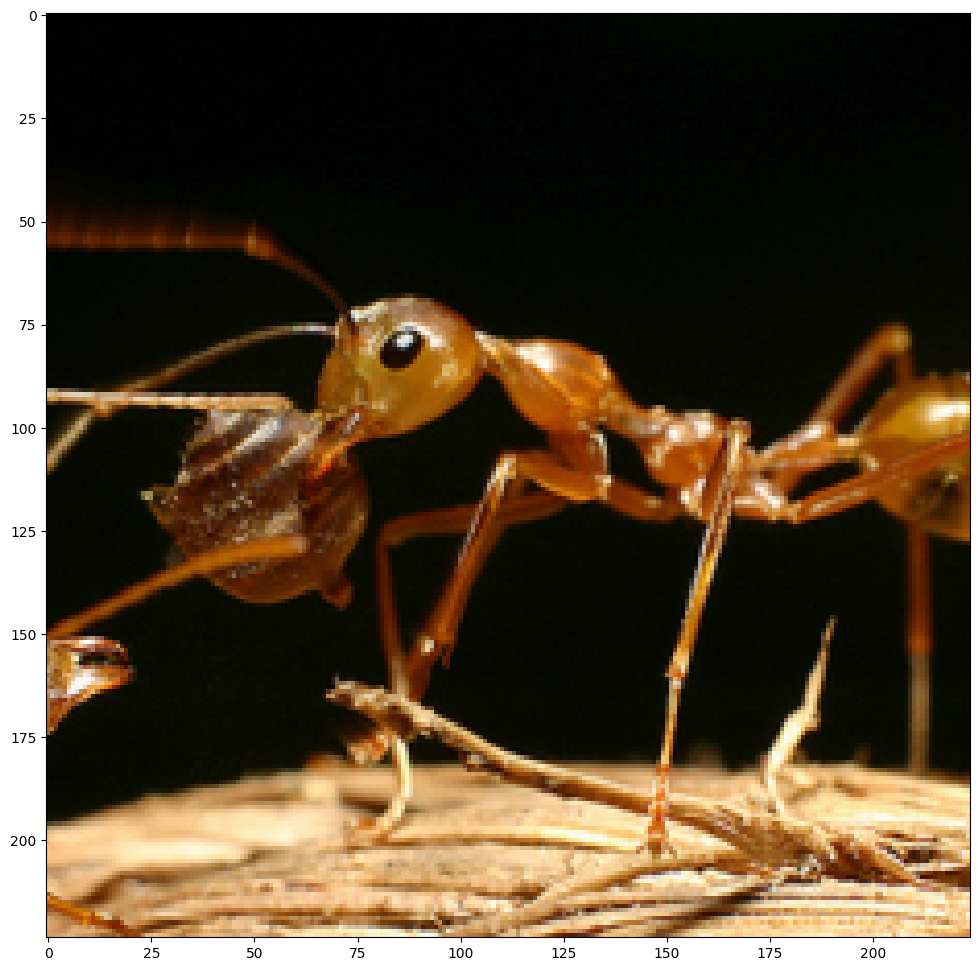

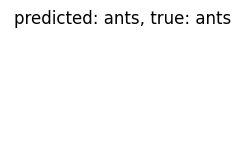

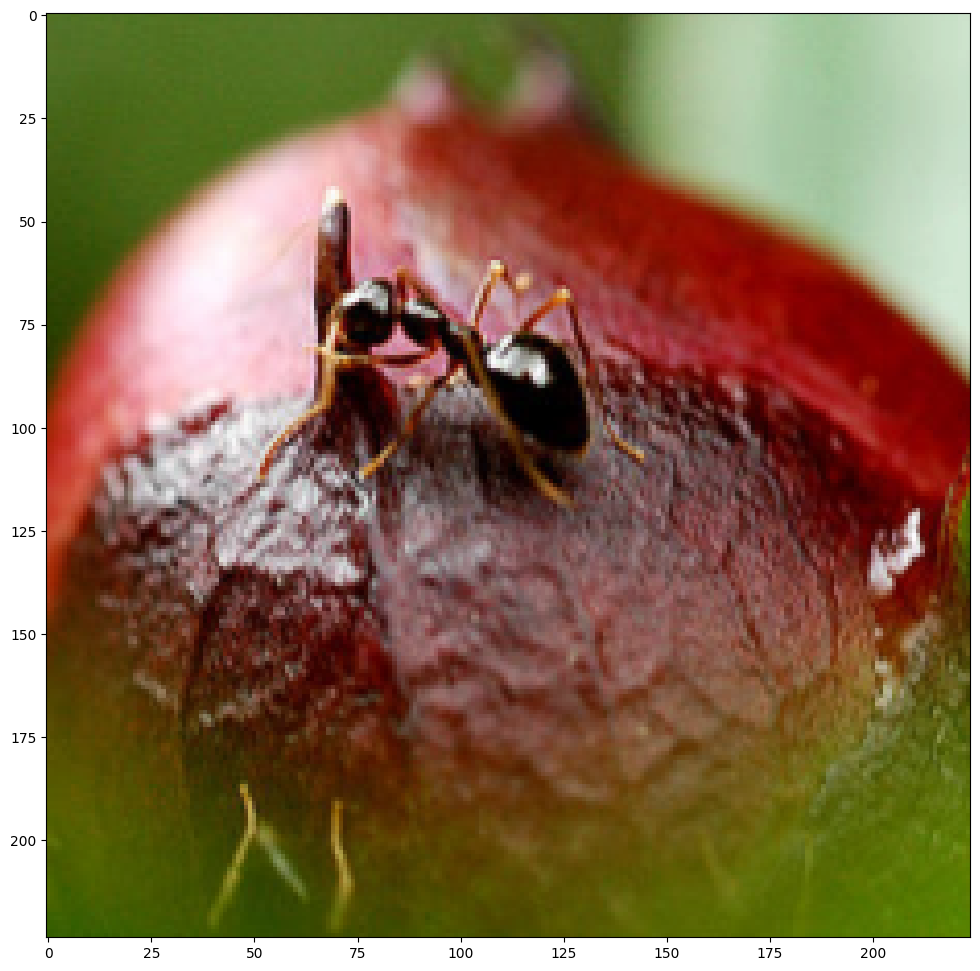

VGG16 Feature Extractor
Epoch 0/9
----------
train Loss: 0.6928 Acc: 0.5533
val Loss: 0.5192 Acc: 0.7908

Epoch 1/9
----------
train Loss: 0.5386 Acc: 0.7213
val Loss: 0.4105 Acc: 0.8889

Epoch 2/9
----------
train Loss: 0.4544 Acc: 0.7869
val Loss: 0.3322 Acc: 0.9346

Epoch 3/9
----------
train Loss: 0.3814 Acc: 0.8648
val Loss: 0.2785 Acc: 0.9542

Epoch 4/9
----------
train Loss: 0.3203 Acc: 0.9016
val Loss: 0.2422 Acc: 0.9608

Epoch 5/9
----------
train Loss: 0.3201 Acc: 0.8893
val Loss: 0.2177 Acc: 0.9608

Epoch 6/9
----------
train Loss: 0.2741 Acc: 0.9098
val Loss: 0.1984 Acc: 0.9608

Epoch 7/9
----------
train Loss: 0.2706 Acc: 0.9139
val Loss: 0.1841 Acc: 0.9608

Epoch 8/9
----------
train Loss: 0.2095 Acc: 0.9303
val Loss: 0.1734 Acc: 0.9673

Epoch 9/9
----------
train Loss: 0.2063 Acc: 0.9467
val Loss: 0.1641 Acc: 0.9673



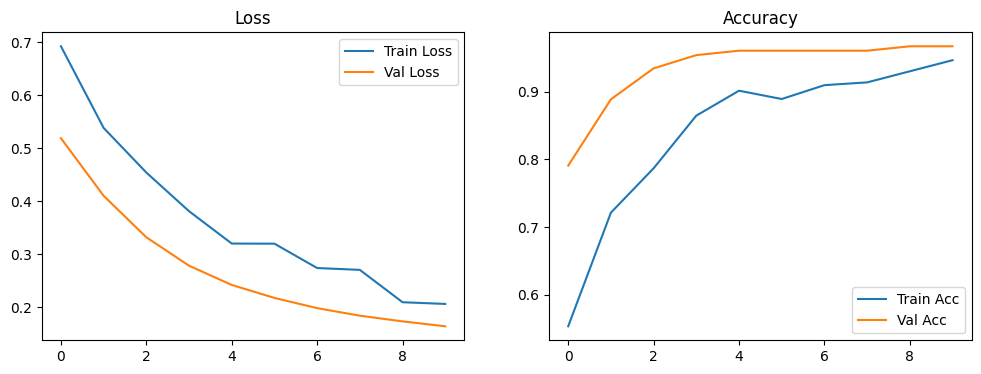

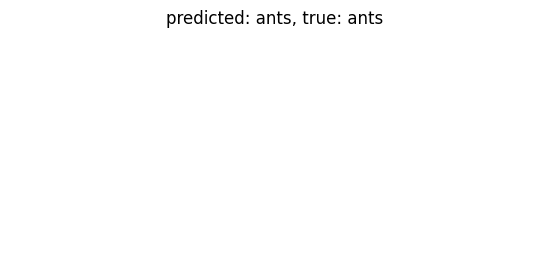

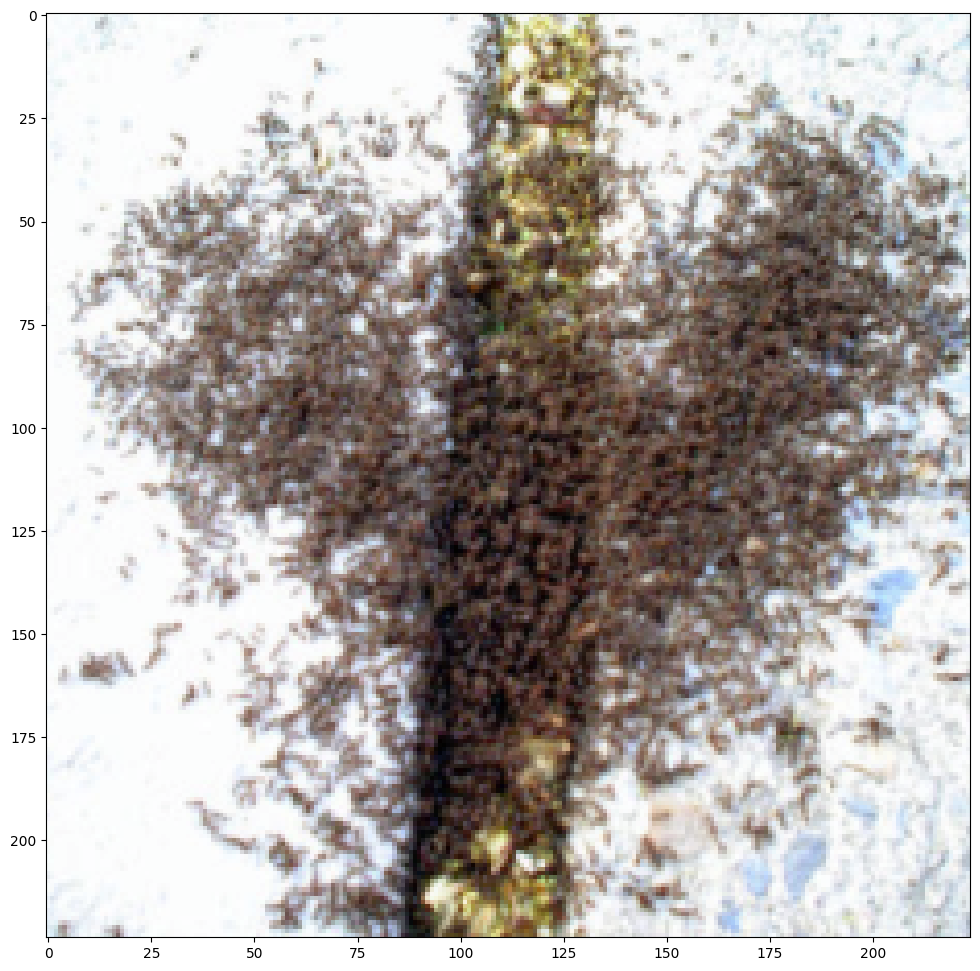

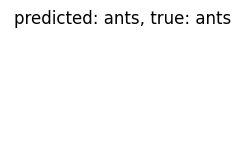

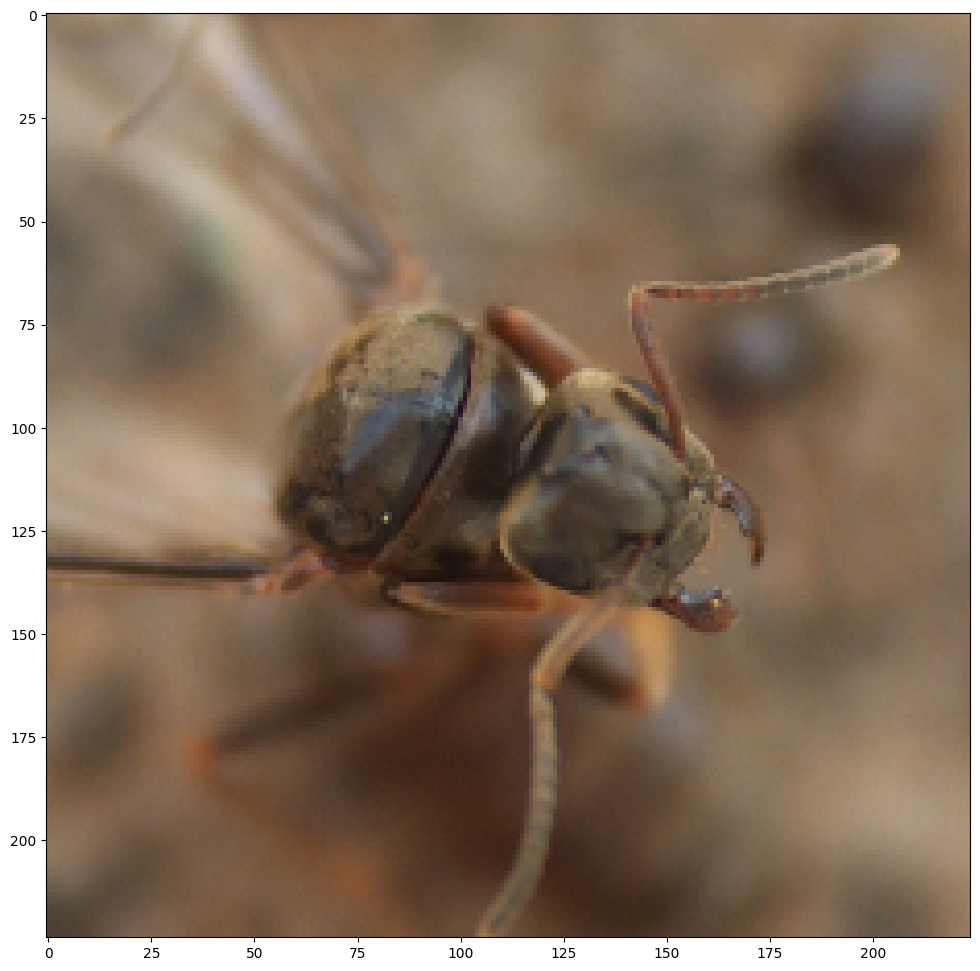

...

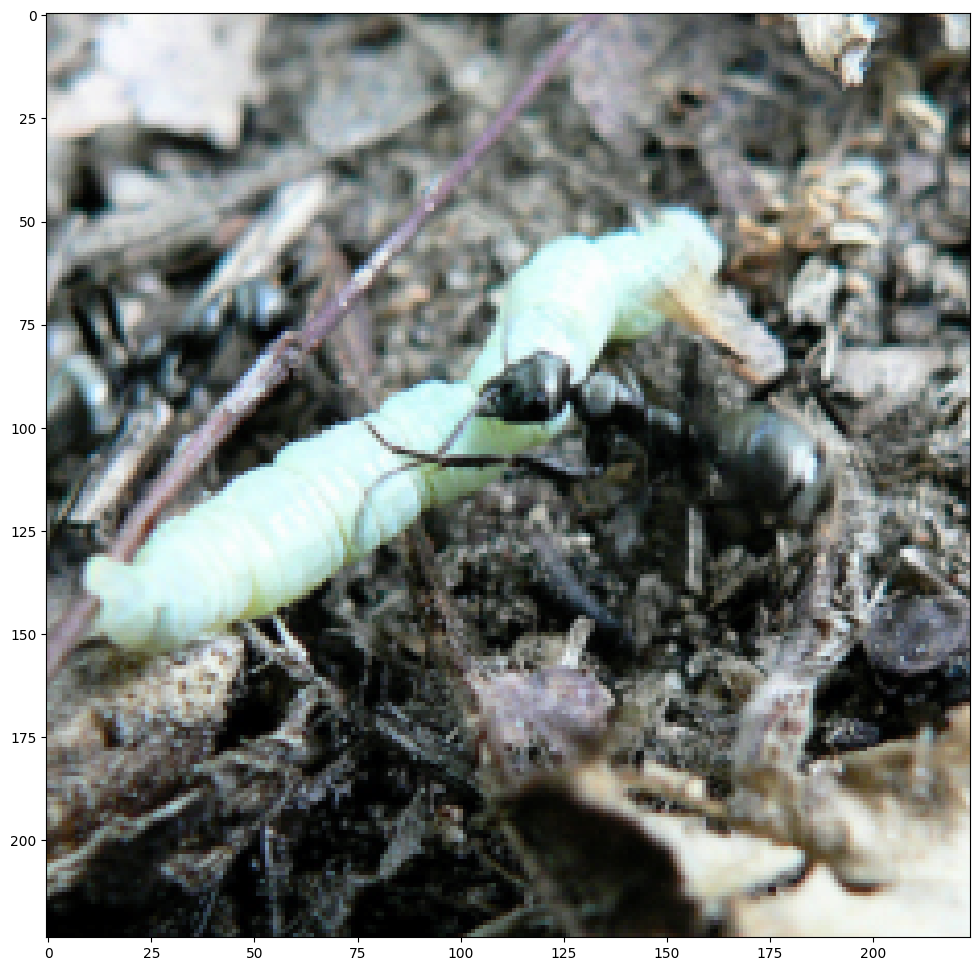

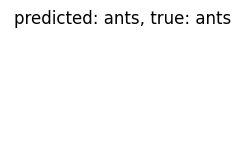

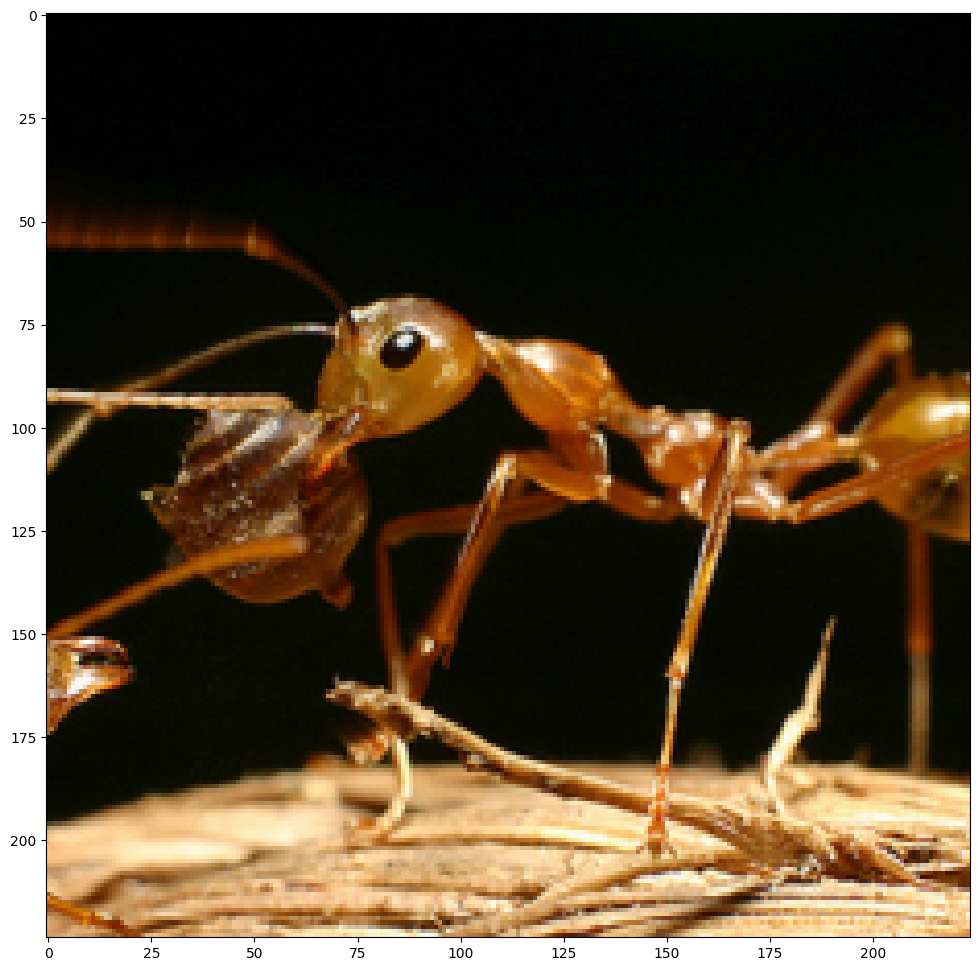

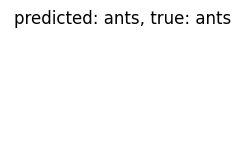

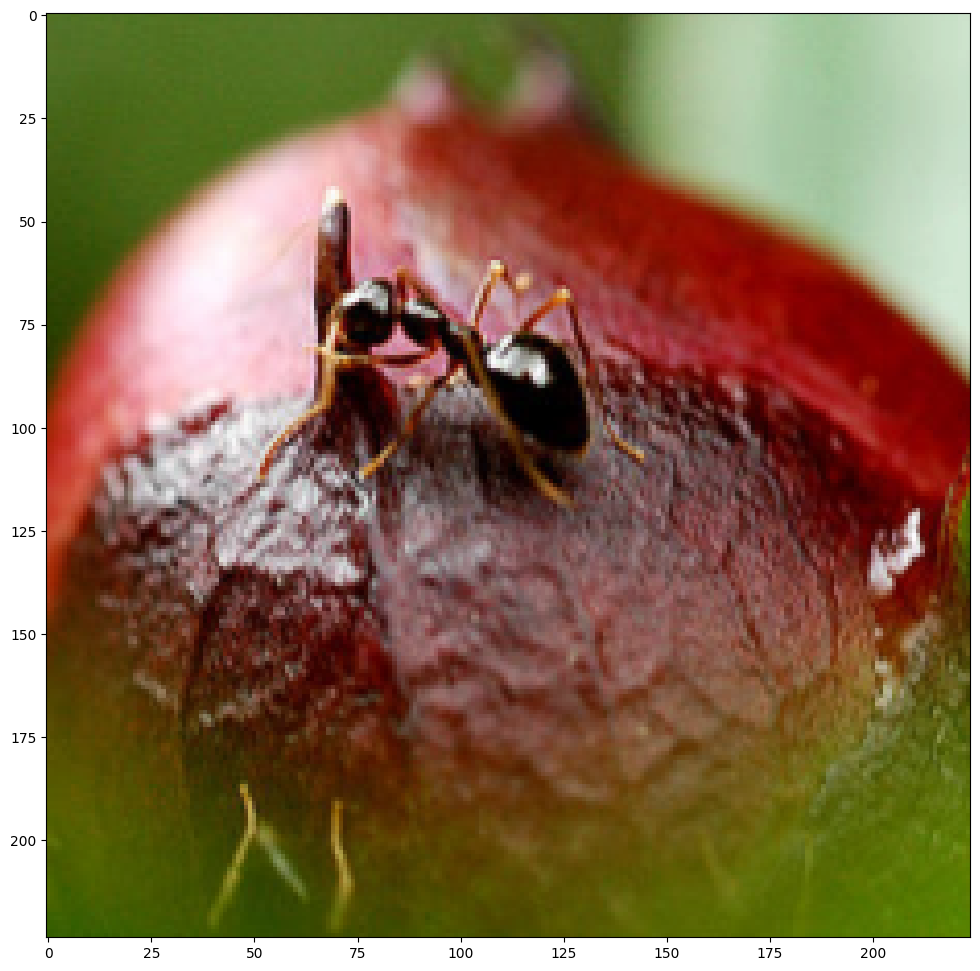

VGG16 Fine Tuning
Epoch 0/9
----------
train Loss: 0.3562 Acc: 0.8484
val Loss: 0.1578 Acc: 0.9542

Epoch 1/9
----------
train Loss: 0.1647 Acc: 0.9262
val Loss: 0.2158 Acc: 0.9412

Epoch 2/9
----------
train Loss: 0.0946 Acc: 0.9590
val Loss: 0.2145 Acc: 0.9412

Epoch 3/9
----------
train Loss: 0.0773 Acc: 0.9713
val Loss: 0.2001 Acc: 0.9477

Epoch 4/9
----------
train Loss: 0.1040 Acc: 0.9590
val Loss: 0.2133 Acc: 0.9542

Epoch 5/9
----------
train Loss: 0.1707 Acc: 0.9344
val Loss: 0.2112 Acc: 0.9477

Epoch 6/9
----------
train Loss: 0.0831 Acc: 0.9672
val Loss: 0.2243 Acc: 0.9477

Epoch 7/9
----------
train Loss: 0.0497 Acc: 0.9836
val Loss: 0.2685 Acc: 0.9346

Epoch 8/9
----------
train Loss: 0.1032 Acc: 0.9754
val Loss: 0.2614 Acc: 0.9542

Epoch 9/9
----------
train Loss: 0.0917 Acc: 0.9590
val Loss: 0.2829 Acc: 0.9412



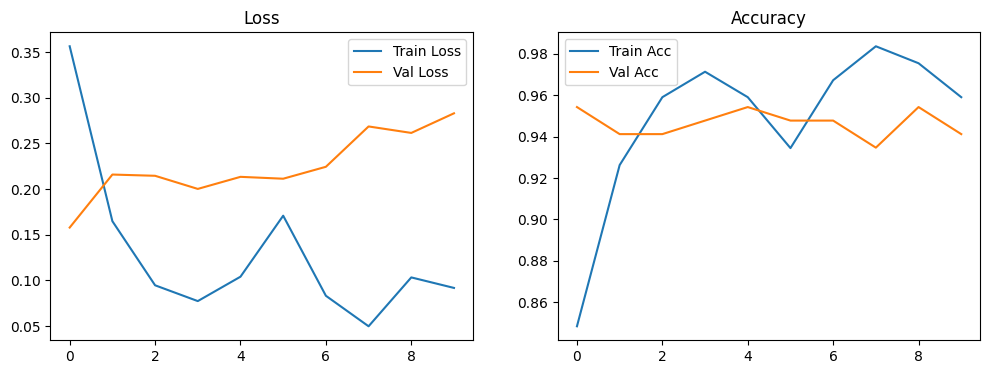

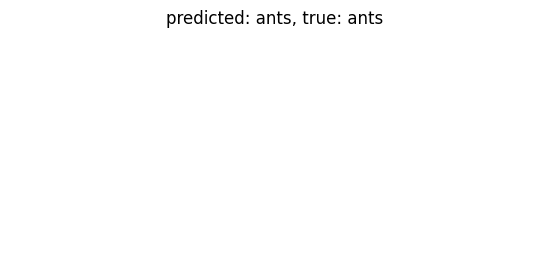

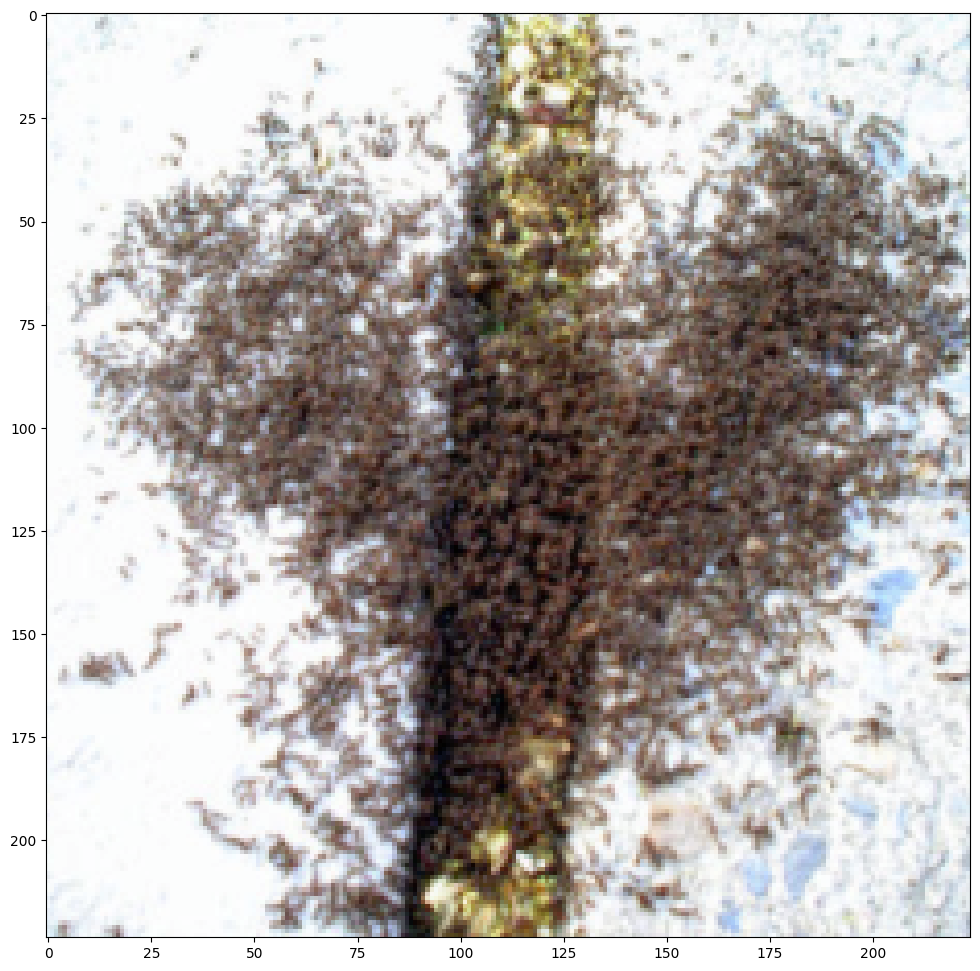

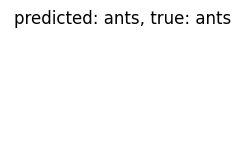

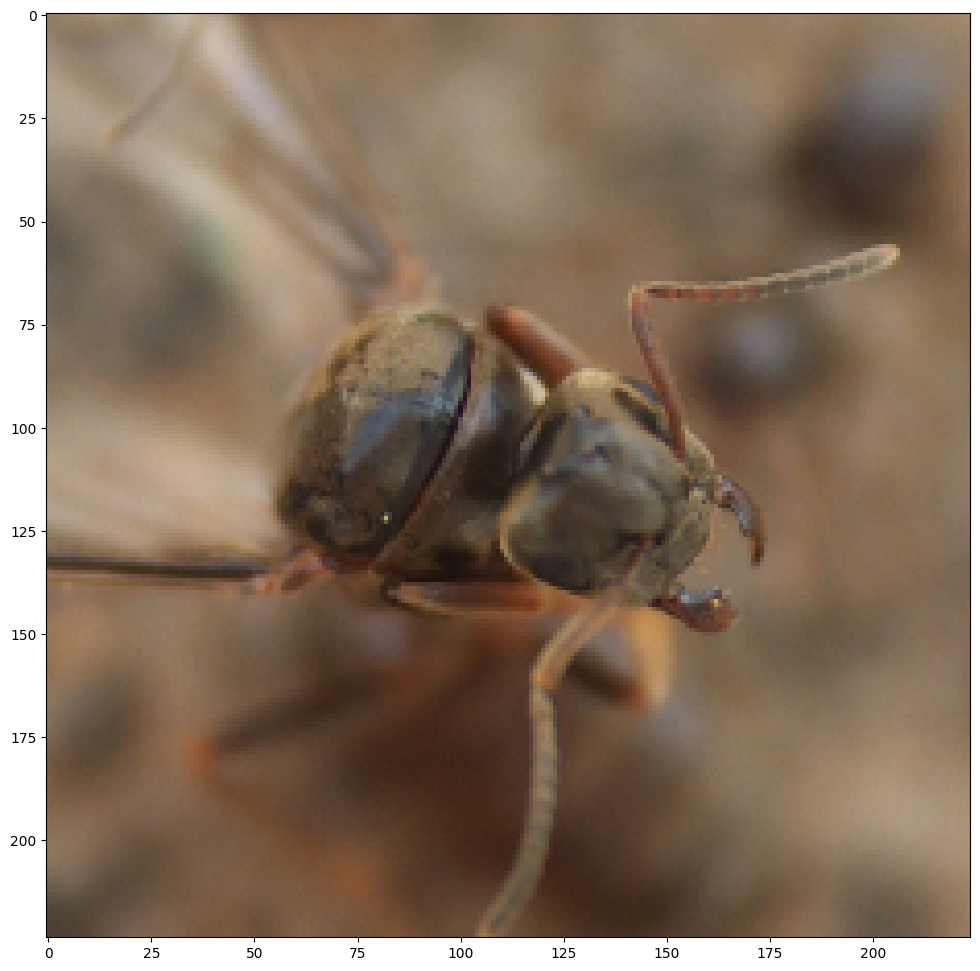

...

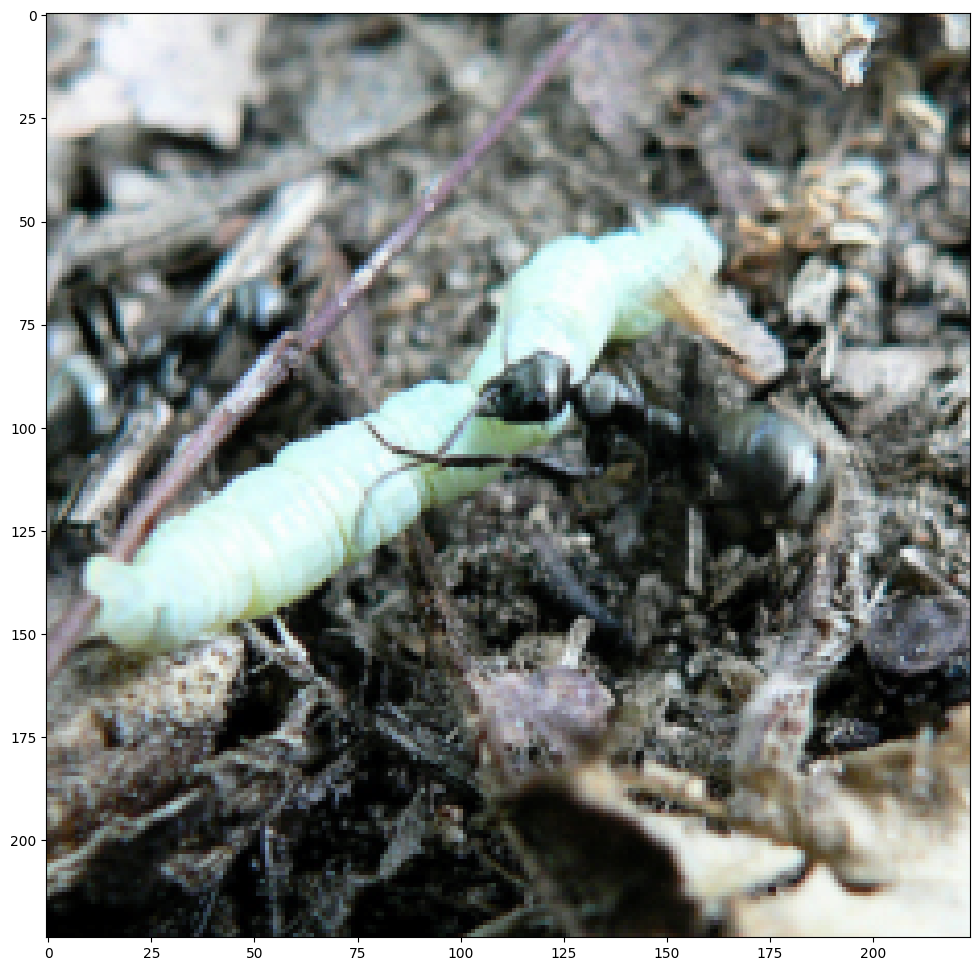

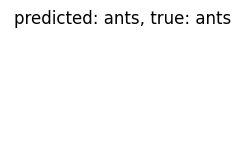

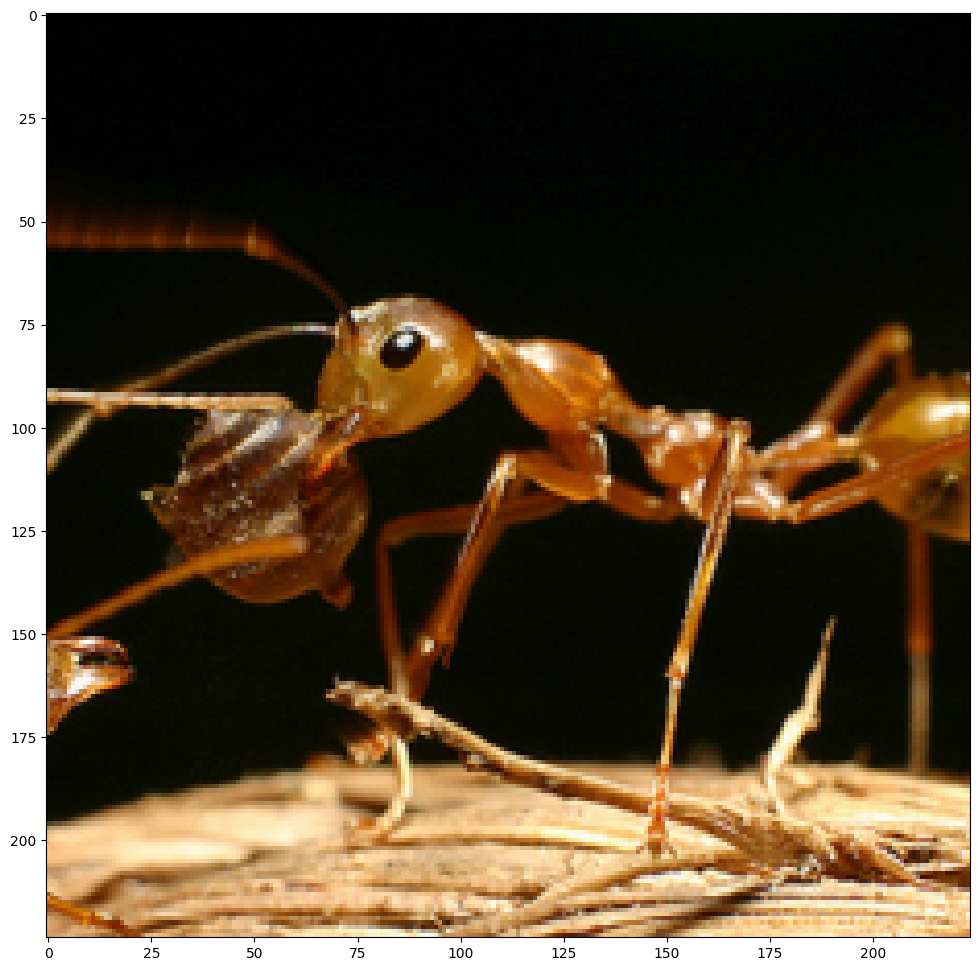

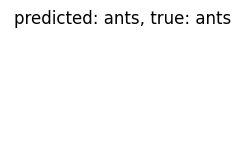

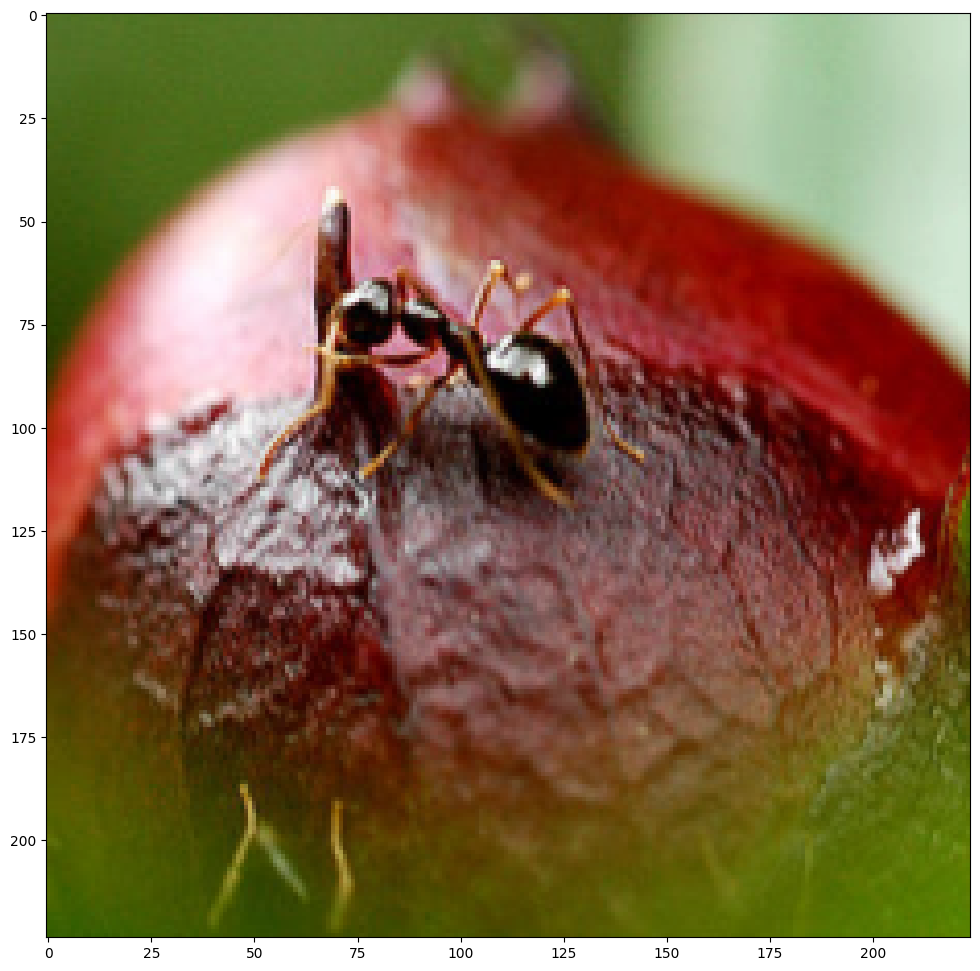

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import time
import os
from matplotlib import pyplot as plt

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

def visualize_model(model, dataloader, class_names, num_images=6):
    device = next(model.parameters()).device
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(15, 10))

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}, true: {class_names[labels[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    plt.show()
                    return
        plt.show()

class ImgRunner:
    def __init__(self):
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def train(self, model, optimizer, criterion, loaders, num_epochs=10):
        model = model.to(self.device)
        self.model = model
        self.optimizer = optimizer
        self.criterion = criterion

        train_losses = []
        val_losses = []
        train_accs = []
        val_accs = []

        for epoch in range(num_epochs):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()
                else:
                    model.eval()

                running_loss = 0.0
                running_corrects = 0

                for inputs, labels in loaders[phase]:
                    inputs = inputs.to(self.device)
                    labels = labels.to(self.device)

                    self.optimizer.zero_grad()

                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = self.criterion(outputs, labels)

                        if phase == 'train':
                            loss.backward()
                            self.optimizer.step()

                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                epoch_loss = running_loss / len(loaders[phase].dataset)
                epoch_acc = running_corrects.double() / len(loaders[phase].dataset)

                if phase == 'train':
                    train_losses.append(epoch_loss)
                    train_accs.append(epoch_acc.item())
                else:
                    val_losses.append(epoch_loss)
                    val_accs.append(epoch_acc.item())

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            print()

        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, label='Train Loss')
        plt.plot(val_losses, label='Val Loss')
        plt.legend()
        plt.title('Loss')

        plt.subplot(1, 2, 2)
        plt.plot(train_accs, label='Train Acc')
        plt.plot(val_accs, label='Val Acc')
        plt.legend()
        plt.title('Accuracy')
        plt.show()

        return model

data_transforms_vgg = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = './hymenoptera_data'
image_datasets_vgg = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms_vgg[x])
                  for x in ['train', 'val']}

dataloaders_vgg = {
    'train': torch.utils.data.DataLoader(image_datasets_vgg['train'], batch_size=32, shuffle=True),
    'val': torch.utils.data.DataLoader(image_datasets_vgg['val'], batch_size=128)
}

class_names = image_datasets_vgg['train'].classes
dataset_sizes = {x: len(image_datasets_vgg[x]) for x in ['train', 'val']}

print(f"Dataset sizes: {dataset_sizes}")
print(f"Class names: {class_names}")

print("VGG16 Full Training")
model_vgg = models.vgg16(pretrained=True)

num_features = model_vgg.classifier[6].in_features
model_vgg.classifier[6] = nn.Linear(num_features, 2)

optimizer = optim.Adam(model_vgg.parameters(), lr=1e-4)

runner_vgg = ImgRunner()
model_vgg = runner_vgg.train(
    model=model_vgg,
    optimizer=optimizer,
    criterion=nn.CrossEntropyLoss(),
    loaders=dataloaders_vgg,
    num_epochs=10
)

visualize_model(model_vgg, dataloaders_vgg['val'], class_names)

print("VGG16 Feature Extractor")
model_vgg_fe = models.vgg16(pretrained=True)

for param in model_vgg_fe.parameters():
    param.requires_grad = False

num_features = model_vgg_fe.classifier[6].in_features
model_vgg_fe.classifier[6] = nn.Linear(num_features, 2)

optimizer_fe = optim.Adam(model_vgg_fe.classifier[6].parameters(), lr=1e-4)

runner_vgg_fe = ImgRunner()
model_vgg_fe = runner_vgg_fe.train(
    model=model_vgg_fe,
    optimizer=optimizer_fe,
    criterion=nn.CrossEntropyLoss(),
    loaders=dataloaders_vgg,
    num_epochs=10
)

visualize_model(model_vgg_fe, dataloaders_vgg['val'], class_names)

print("VGG16 Fine Tuning")
model_vgg_ft = models.vgg16(pretrained=True)

for param in model_vgg_ft.features.parameters():
    param.requires_grad = False

num_features = model_vgg_ft.classifier[6].in_features
model_vgg_ft.classifier[6] = nn.Linear(num_features, 2)

optimizer_ft = optim.Adam(model_vgg_ft.classifier.parameters(), lr=1e-4)

runner_vgg_ft = ImgRunner()
model_vgg_ft = runner_vgg_ft.train(
    model=model_vgg_ft,
    optimizer=optimizer_ft,
    criterion=nn.CrossEntropyLoss(),
    loaders=dataloaders_vgg,
    num_epochs=10
)

visualize_model(model_vgg_ft, dataloaders_vgg['val'], class_names)

Inception_v3 Full Training
Epoch 0/9
----------
train Loss: 0.5499 Acc: 0.7008
val Loss: 0.2627 Acc: 0.9477

Epoch 1/9
----------
train Loss: 0.2347 Acc: 0.9549
val Loss: 0.1587 Acc: 0.9412

Epoch 2/9
----------
train Loss: 0.1028 Acc: 0.9672
val Loss: 0.1461 Acc: 0.9346

Epoch 3/9
----------
train Loss: 0.0990 Acc: 0.9631
val Loss: 0.1614 Acc: 0.9346

Epoch 4/9
----------
train Loss: 0.0851 Acc: 0.9754
val Loss: 0.1646 Acc: 0.9346

Epoch 5/9
----------
train Loss: 0.0526 Acc: 0.9877
val Loss: 0.1560 Acc: 0.9412

Epoch 6/9
----------
train Loss: 0.0694 Acc: 0.9836
val Loss: 0.1608 Acc: 0.9346

Epoch 7/9
----------
train Loss: 0.0519 Acc: 0.9754
val Loss: 0.1463 Acc: 0.9346

Epoch 8/9
----------
train Loss: 0.0886 Acc: 0.9713
val Loss: 0.1632 Acc: 0.9346

Epoch 9/9
----------
train Loss: 0.0664 Acc: 0.9795
val Loss: 0.1607 Acc: 0.9216



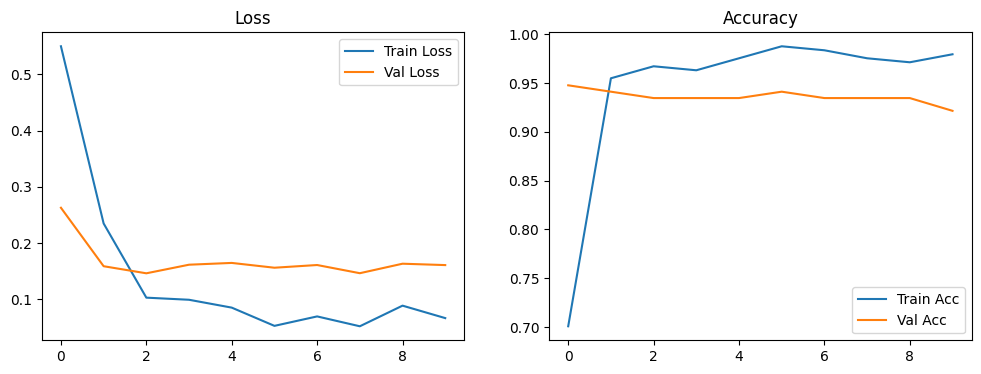

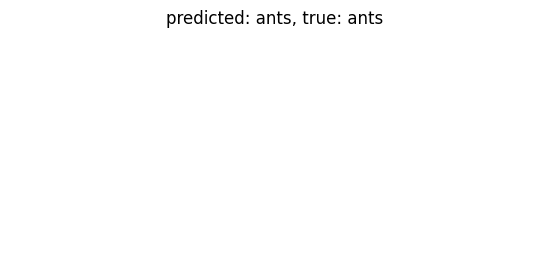

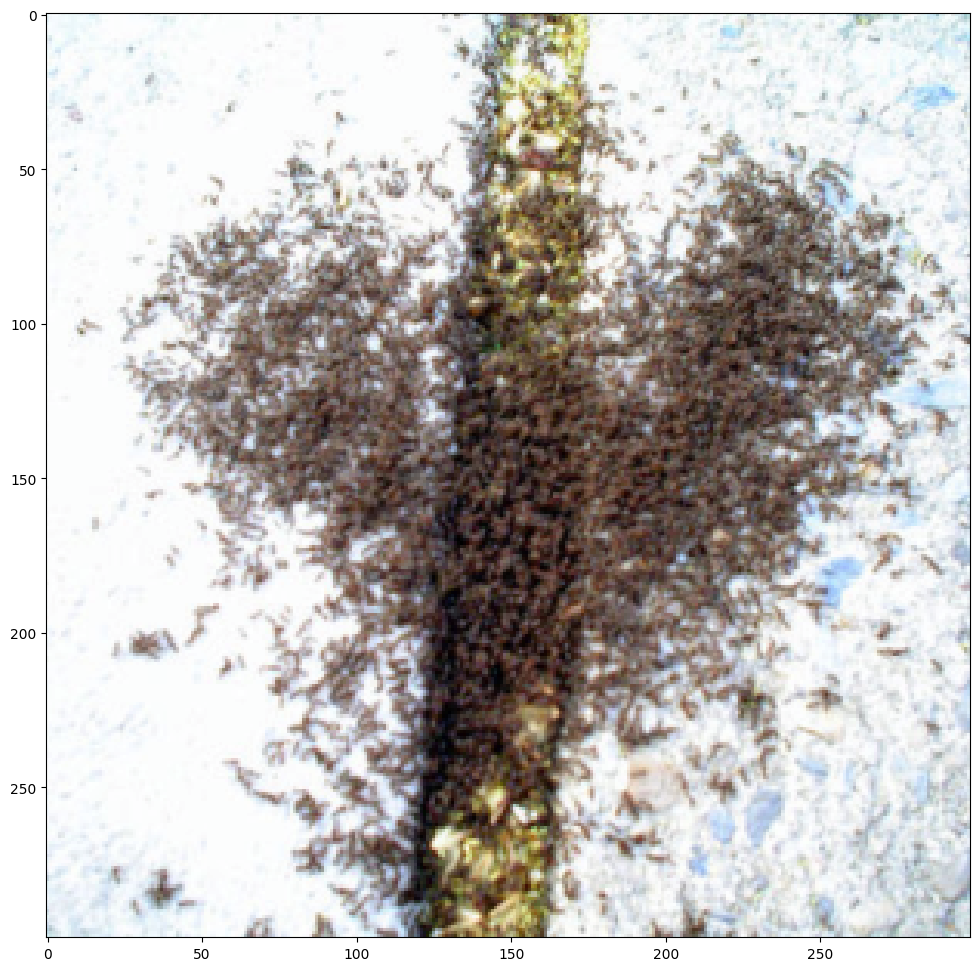

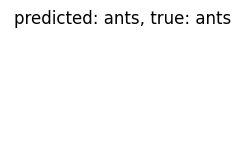

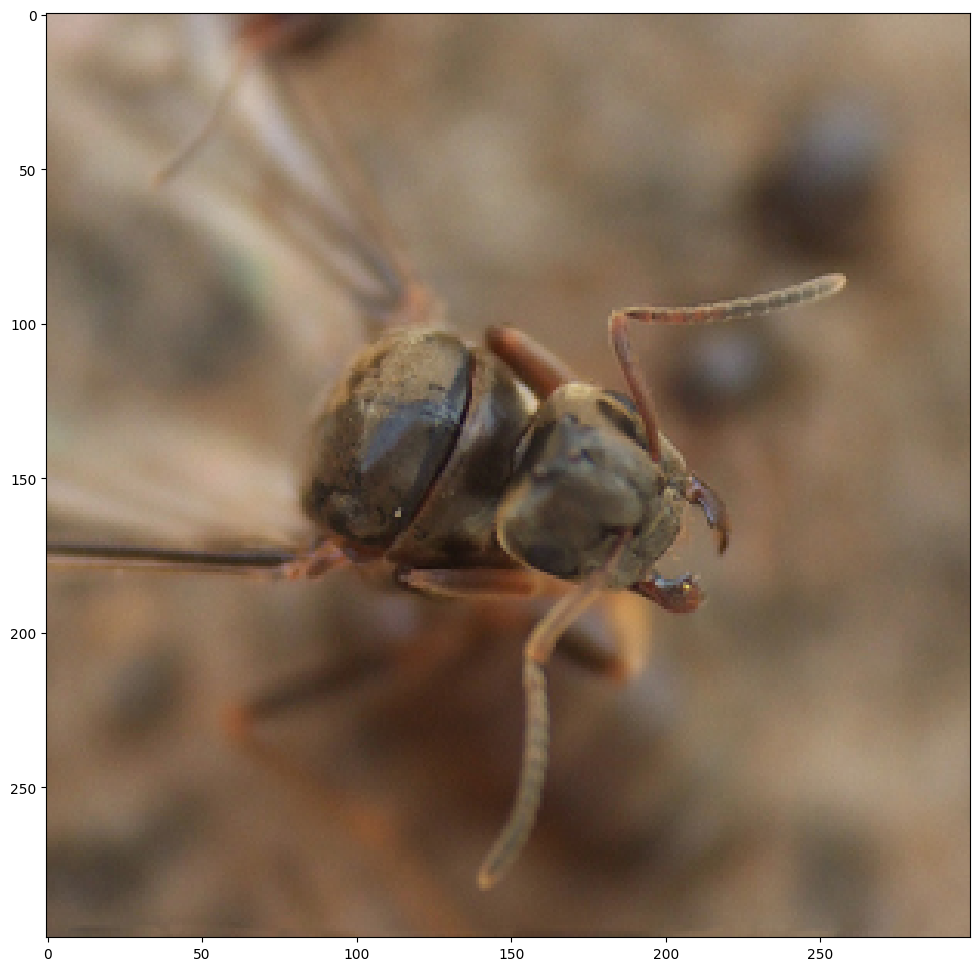

...

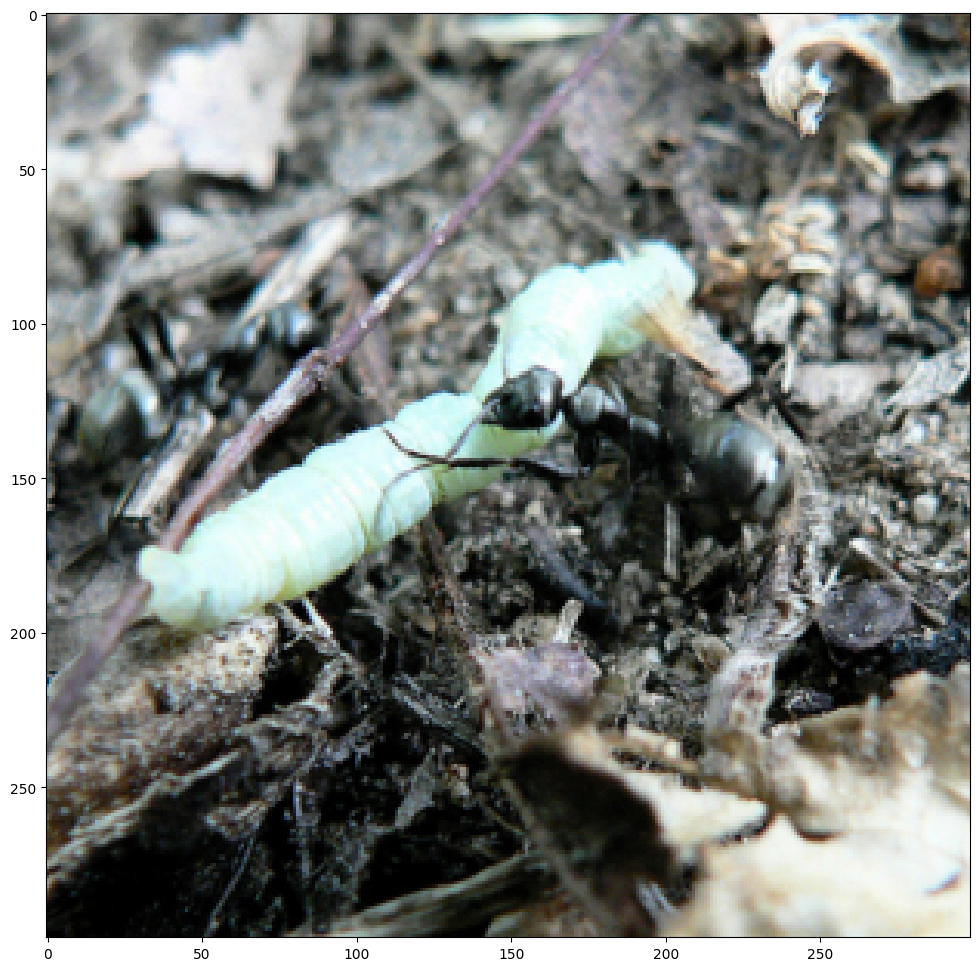

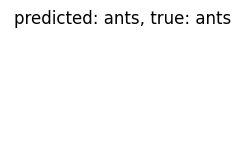

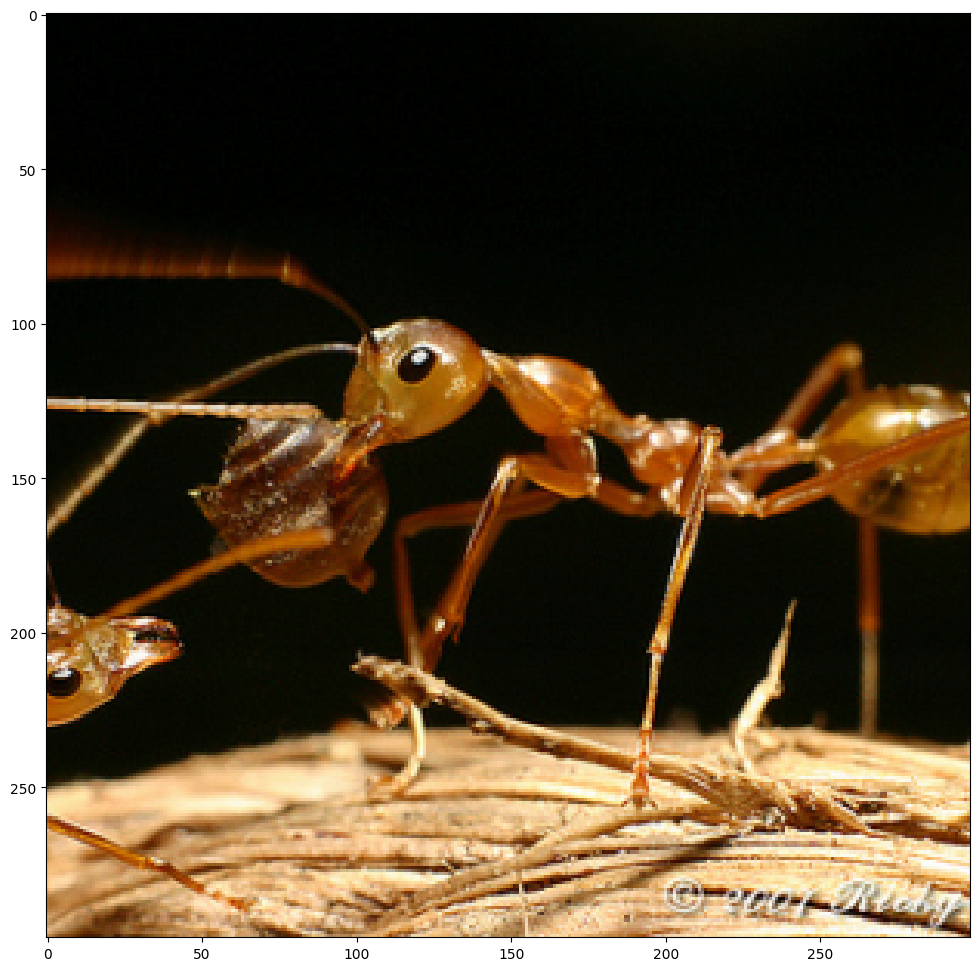

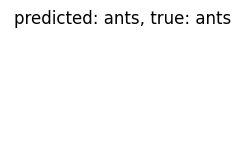

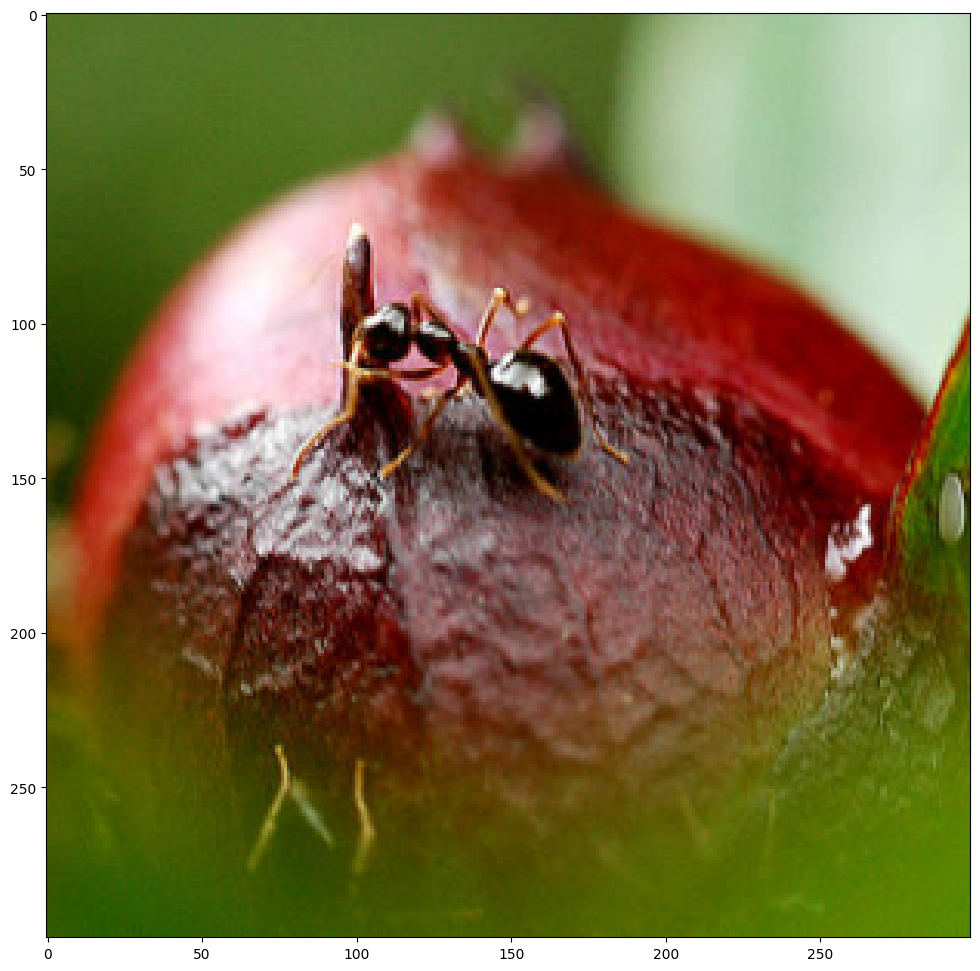

Inception_v3 Feature Extractor
Epoch 0/9
----------
train Loss: 0.7285 Acc: 0.5000
val Loss: 0.6840 Acc: 0.5425

Epoch 1/9
----------
train Loss: 0.6839 Acc: 0.5287
val Loss: 0.6503 Acc: 0.7255

Epoch 2/9
----------
train Loss: 0.6766 Acc: 0.5984
val Loss: 0.6286 Acc: 0.7255

Epoch 3/9
----------
train Loss: 0.6578 Acc: 0.6189
val Loss: 0.6102 Acc: 0.7778

Epoch 4/9
----------
train Loss: 0.6332 Acc: 0.6639
val Loss: 0.5928 Acc: 0.8235

Epoch 5/9
----------
train Loss: 0.6185 Acc: 0.6926
val Loss: 0.5744 Acc: 0.8170

Epoch 6/9
----------
train Loss: 0.6008 Acc: 0.7418
val Loss: 0.5619 Acc: 0.8627

Epoch 7/9
----------
train Loss: 0.5658 Acc: 0.8033
val Loss: 0.5473 Acc: 0.8889

Epoch 8/9
----------
train Loss: 0.5734 Acc: 0.7541
val Loss: 0.5359 Acc: 0.9020

Epoch 9/9
----------
train Loss: 0.5506 Acc: 0.7992
val Loss: 0.5220 Acc: 0.9281



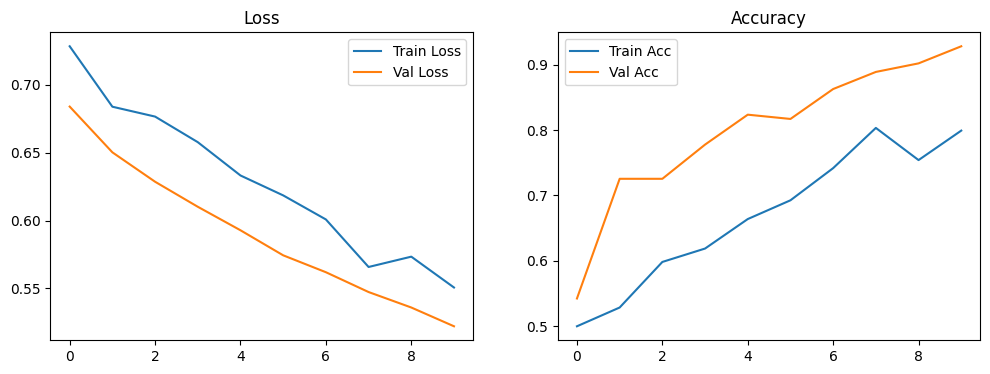

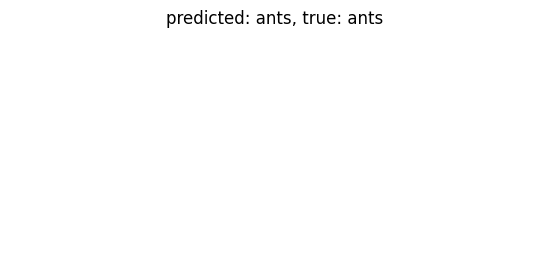

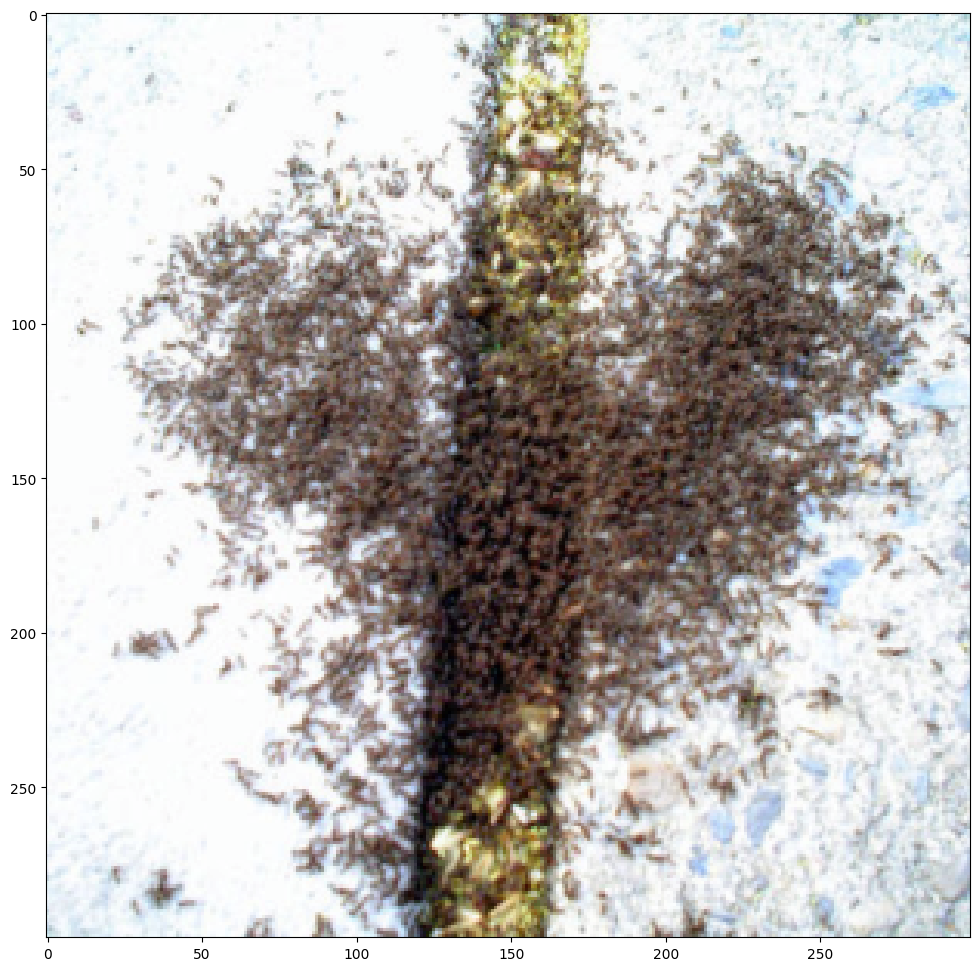

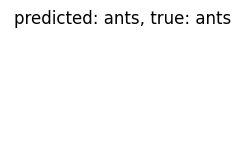

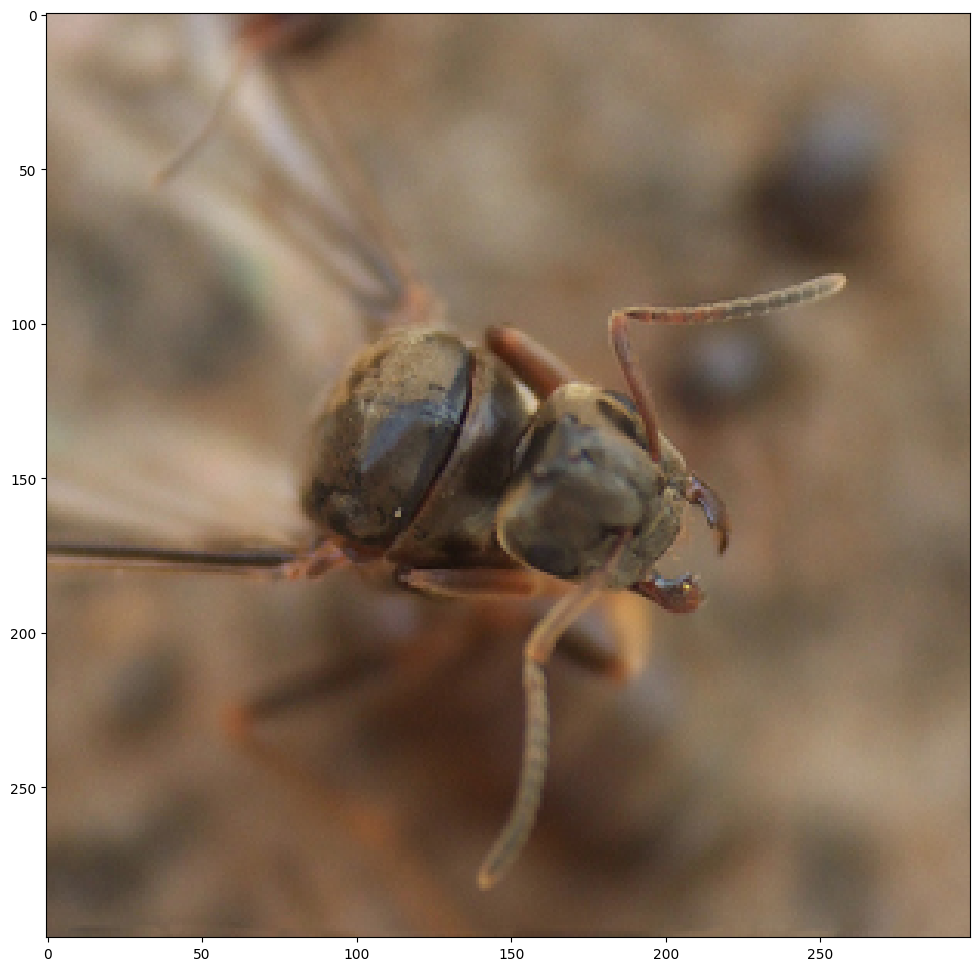

...

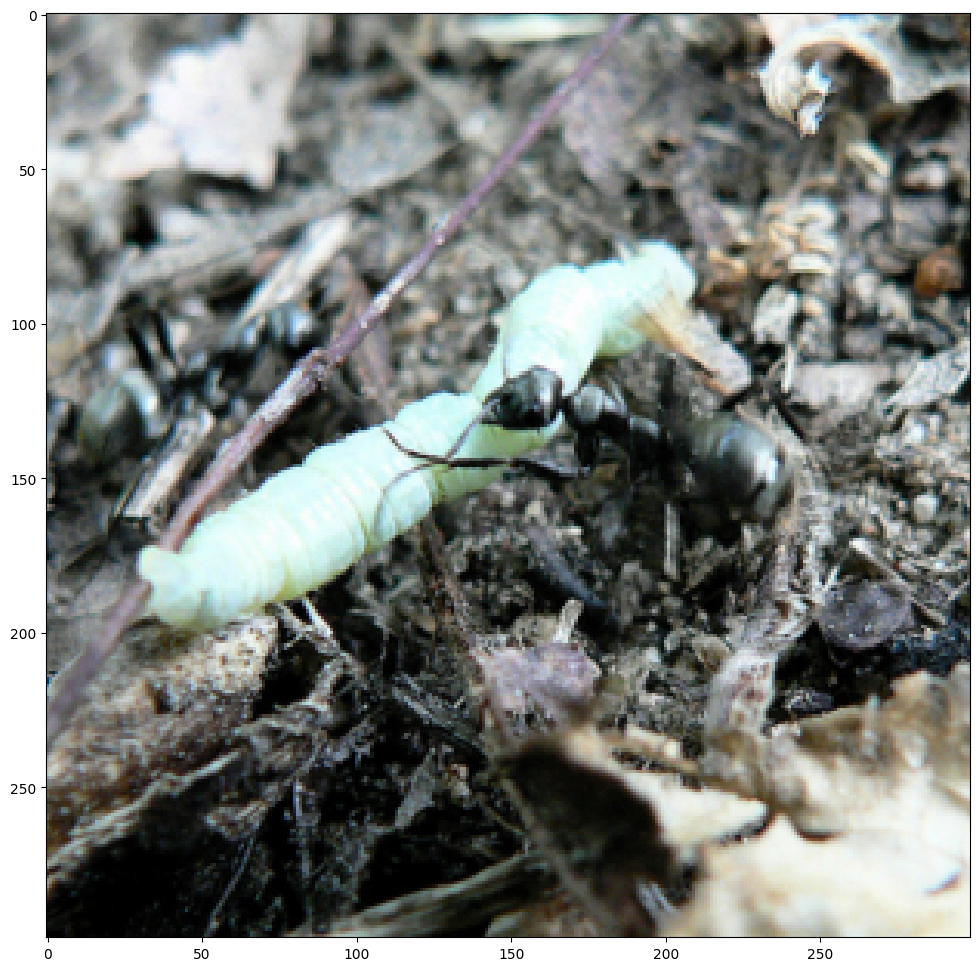

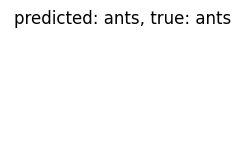

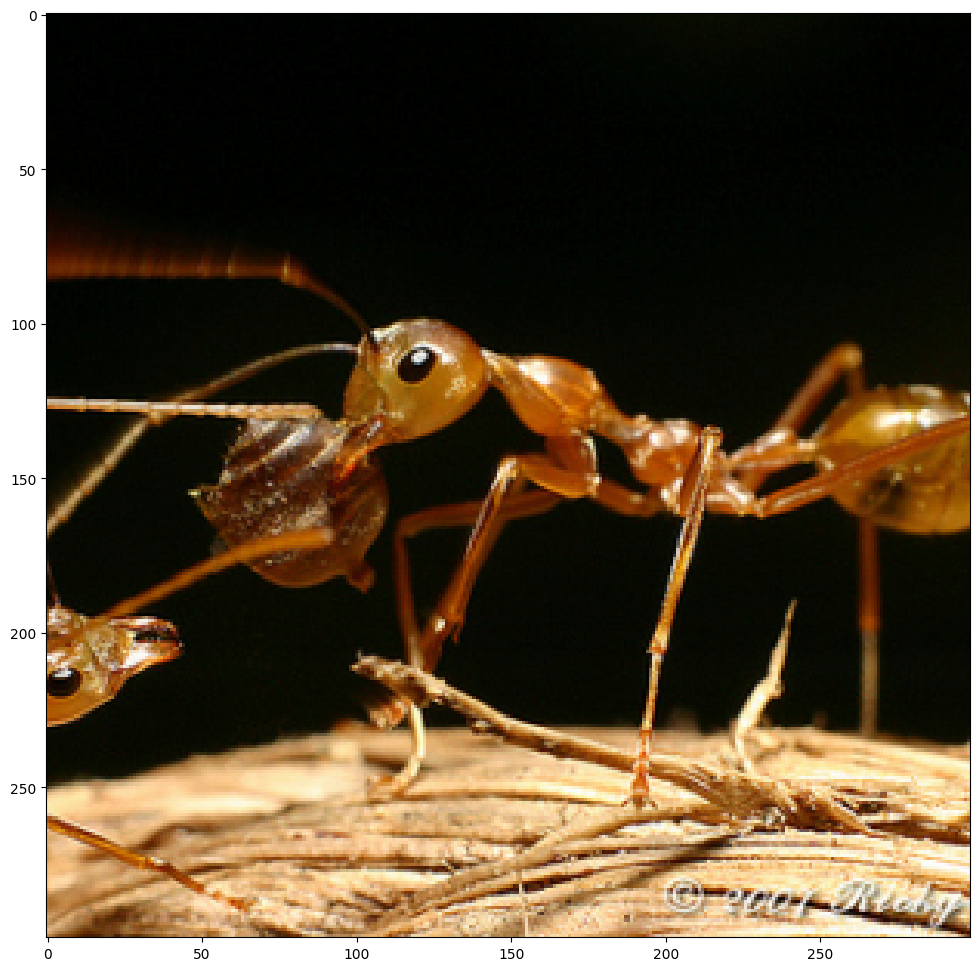

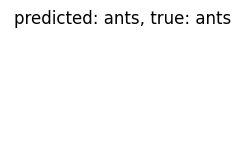

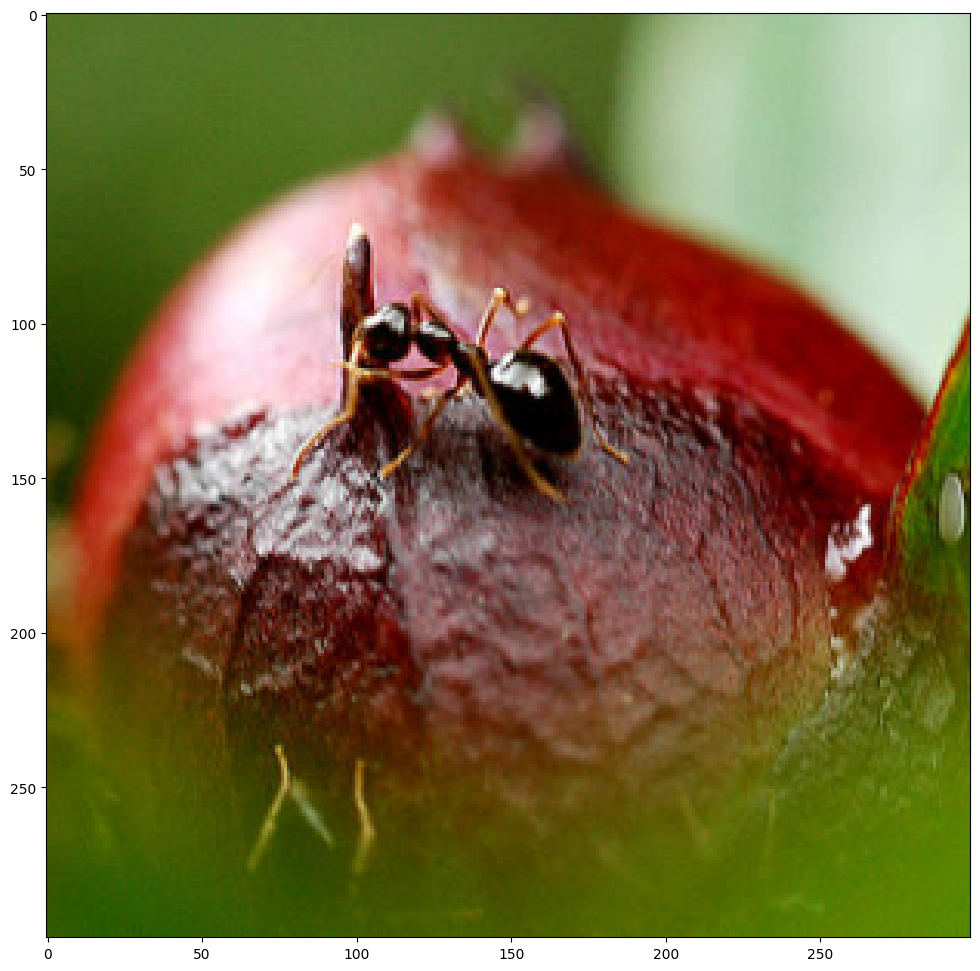

Inception_v3 Fine Tuning
Epoch 0/9
----------
train Loss: 0.6959 Acc: 0.5410
val Loss: 0.6417 Acc: 0.6993

Epoch 1/9
----------
train Loss: 0.6516 Acc: 0.6434
val Loss: 0.6164 Acc: 0.8039

Epoch 2/9
----------
train Loss: 0.6222 Acc: 0.6926
val Loss: 0.5969 Acc: 0.8235

Epoch 3/9
----------
train Loss: 0.6124 Acc: 0.7377
val Loss: 0.5798 Acc: 0.8431

Epoch 4/9
----------
train Loss: 0.5999 Acc: 0.7090
val Loss: 0.5633 Acc: 0.8562

Epoch 5/9
----------
train Loss: 0.5900 Acc: 0.7295
val Loss: 0.5572 Acc: 0.8366

Epoch 6/9
----------
train Loss: 0.5618 Acc: 0.7828
val Loss: 0.5397 Acc: 0.8431

Epoch 7/9
----------
train Loss: 0.5411 Acc: 0.8238
val Loss: 0.5246 Acc: 0.8431

Epoch 8/9
----------
train Loss: 0.5230 Acc: 0.8443
val Loss: 0.5072 Acc: 0.8627

Epoch 9/9
----------
train Loss: 0.5264 Acc: 0.8115
val Loss: 0.4935 Acc: 0.8758



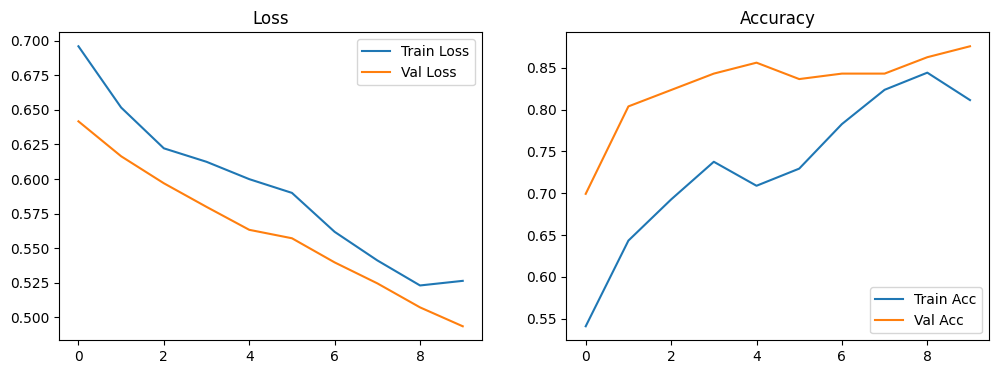

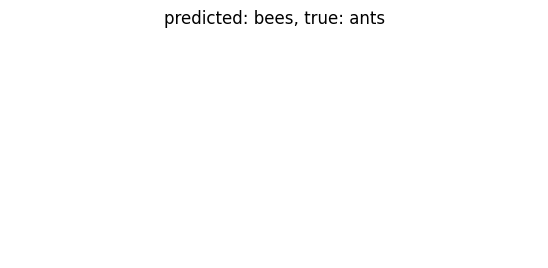

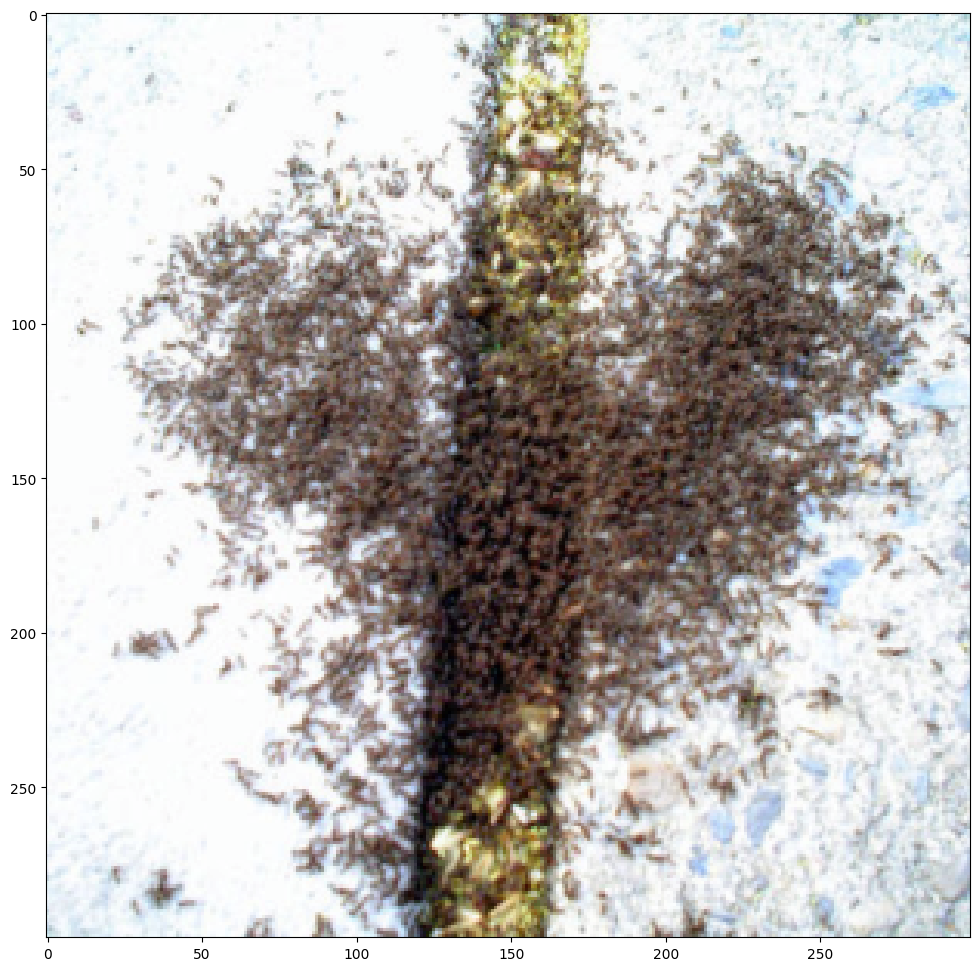

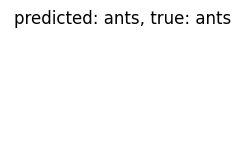

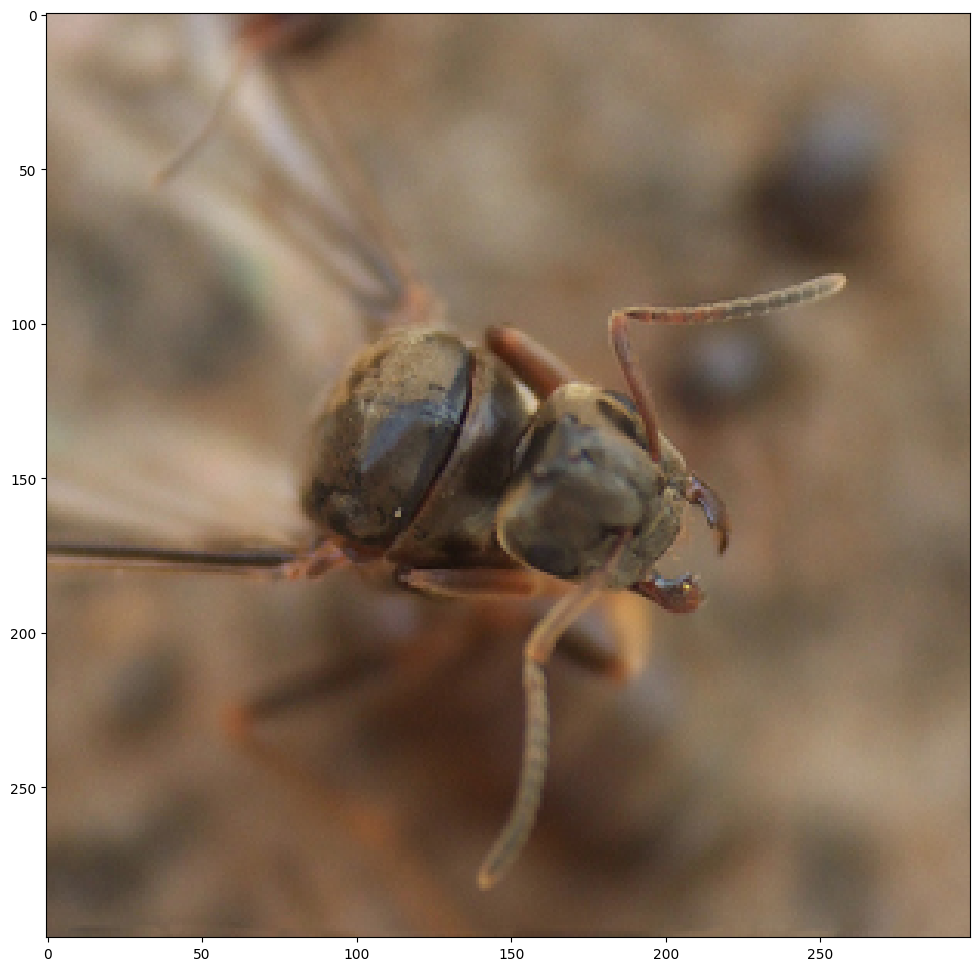

...

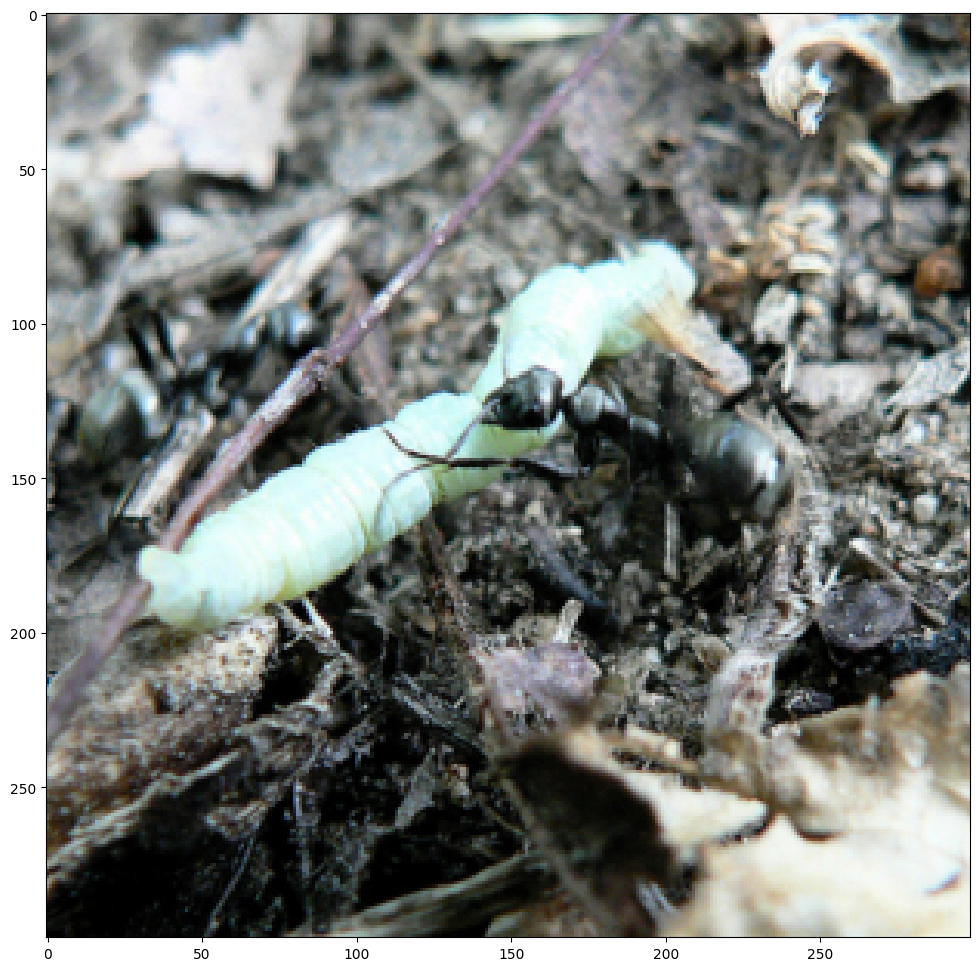

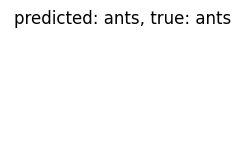

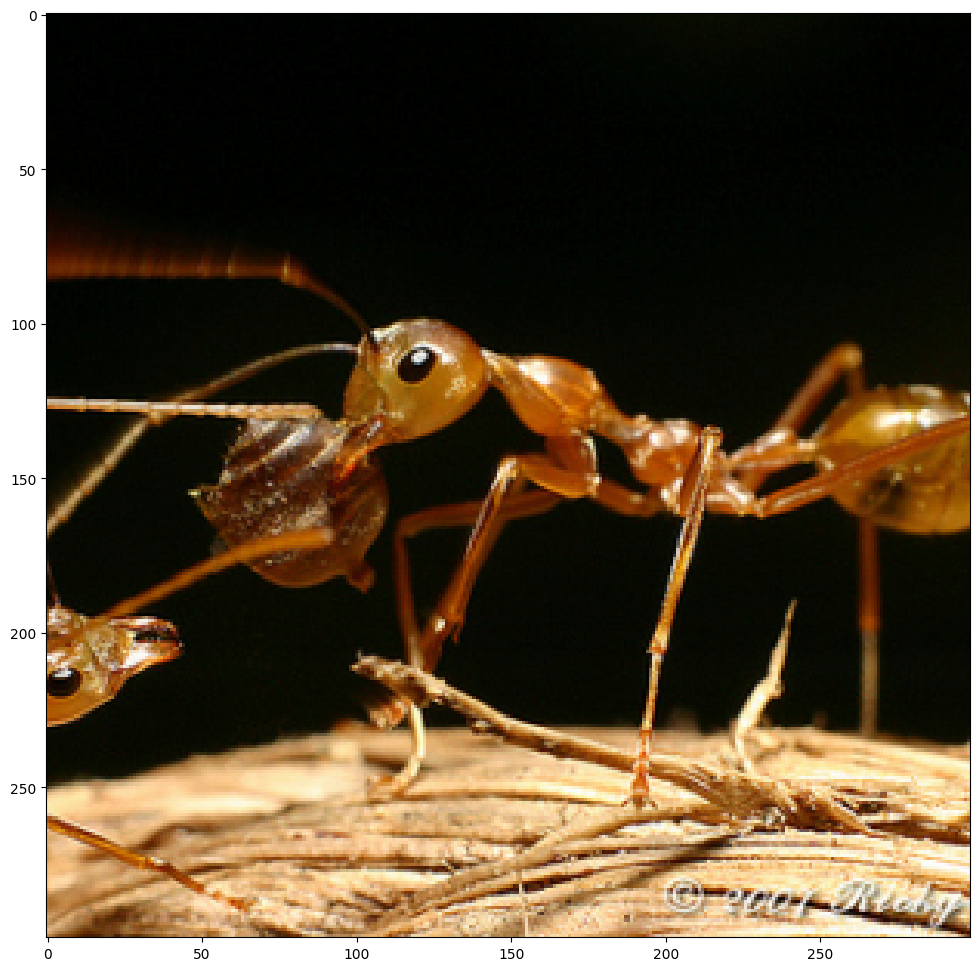

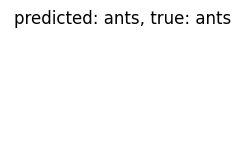

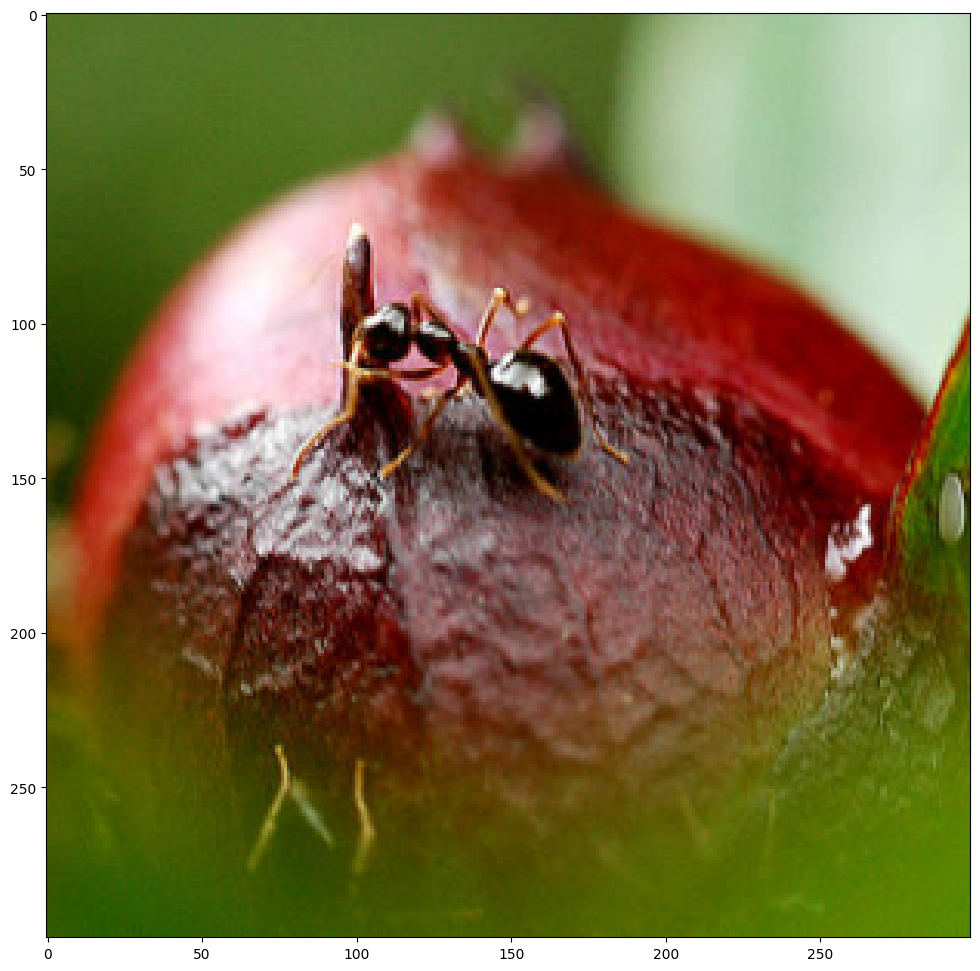

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import time
import os
from matplotlib import pyplot as plt

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

def visualize_model(model, dataloader, class_names, num_images=6):
    device = next(model.parameters()).device
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(15, 10))

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)
            outputs = model(inputs)
            if isinstance(outputs, torchvision.models.inception.InceptionOutputs):
                outputs = outputs.logits
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}, true: {class_names[labels[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    plt.show()
                    return
        plt.show()

class ImgRunner:
    def __init__(self):
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def train(self, model, optimizer, criterion, loaders, num_epochs=10):
        model = model.to(self.device)
        self.model = model
        self.optimizer = optimizer
        self.criterion = criterion

        train_losses = []
        val_losses = []
        train_accs = []
        val_accs = []

        for epoch in range(num_epochs):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()
                else:
                    model.eval()

                running_loss = 0.0
                running_corrects = 0

                for inputs, labels in loaders[phase]:
                    inputs = inputs.to(self.device)
                    labels = labels.to(self.device)

                    self.optimizer.zero_grad()

                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        if isinstance(outputs, torchvision.models.inception.InceptionOutputs):
                            outputs = outputs.logits
                        _, preds = torch.max(outputs, 1)
                        loss = self.criterion(outputs, labels)

                        if phase == 'train':
                            loss.backward()
                            self.optimizer.step()

                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                epoch_loss = running_loss / len(loaders[phase].dataset)
                epoch_acc = running_corrects.double() / len(loaders[phase].dataset)

                if phase == 'train':
                    train_losses.append(epoch_loss)
                    train_accs.append(epoch_acc.item())
                else:
                    val_losses.append(epoch_loss)
                    val_accs.append(epoch_acc.item())

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            print()

        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, label='Train Loss')
        plt.plot(val_losses, label='Val Loss')
        plt.legend()
        plt.title('Loss')

        plt.subplot(1, 2, 2)
        plt.plot(train_accs, label='Train Acc')
        plt.plot(val_accs, label='Val Acc')
        plt.legend()
        plt.title('Accuracy')
        plt.show()

        return model

data_transforms_inception = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(299),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(299),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = './hymenoptera_data'
image_datasets_inception = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms_inception[x])
                  for x in ['train', 'val']}

dataloaders_inception = {
    'train': torch.utils.data.DataLoader(image_datasets_inception['train'], batch_size=32, shuffle=True),
    'val': torch.utils.data.DataLoader(image_datasets_inception['val'], batch_size=128)
}

class_names = image_datasets_inception['train'].classes

print("Inception_v3 Full Training")
model_inception = models.inception_v3(pretrained=True)

num_features = model_inception.fc.in_features
model_inception.fc = nn.Linear(num_features, 2)

if model_inception.AuxLogits is not None:
    num_aux_features = model_inception.AuxLogits.fc.in_features
    model_inception.AuxLogits.fc = nn.Linear(num_aux_features, 2)

optimizer = optim.Adam(model_inception.parameters(), lr=1e-4)

runner_inception = ImgRunner()
model_inception = runner_inception.train(
    model=model_inception,
    optimizer=optimizer,
    criterion=nn.CrossEntropyLoss(),
    loaders=dataloaders_inception,
    num_epochs=10
)

visualize_model(model_inception, dataloaders_inception['val'], class_names)

print("Inception_v3 Feature Extractor")
model_inception_fe = models.inception_v3(pretrained=True)

for param in model_inception_fe.parameters():
    param.requires_grad = False

num_features = model_inception_fe.fc.in_features
model_inception_fe.fc = nn.Linear(num_features, 2)

if model_inception_fe.AuxLogits is not None:
    num_aux_features = model_inception_fe.AuxLogits.fc.in_features
    model_inception_fe.AuxLogits.fc = nn.Linear(num_aux_features, 2)

optimizer_fe = optim.Adam(model_inception_fe.fc.parameters(), lr=1e-4)

runner_inception_fe = ImgRunner()
model_inception_fe = runner_inception_fe.train(
    model=model_inception_fe,
    optimizer=optimizer_fe,
    criterion=nn.CrossEntropyLoss(),
    loaders=dataloaders_inception,
    num_epochs=10
)

visualize_model(model_inception_fe, dataloaders_inception['val'], class_names)

print("Inception_v3 Fine Tuning")
model_inception_ft = models.inception_v3(pretrained=True)

for param in model_inception_ft.parameters():
    param.requires_grad = False

for name, param in model_inception_ft.named_parameters():
    if any([f'.{i}.' in name for i in range(16-5, 16)]):
        param.requires_grad = True

num_features = model_inception_ft.fc.in_features
model_inception_ft.fc = nn.Linear(num_features, 2)

if model_inception_ft.AuxLogits is not None:
    num_aux_features = model_inception_ft.AuxLogits.fc.in_features
    model_inception_ft.AuxLogits.fc = nn.Linear(num_aux_features, 2)

params_to_update = []
for name, param in model_inception_ft.named_parameters():
    if param.requires_grad:
        params_to_update.append(param)

optimizer_ft = optim.Adam(params_to_update, lr=1e-4)

runner_inception_ft = ImgRunner()
model_inception_ft = runner_inception_ft.train(
    model=model_inception_ft,
    optimizer=optimizer_ft,
    criterion=nn.CrossEntropyLoss(),
    loaders=dataloaders_inception,
    num_epochs=10
)

visualize_model(model_inception_ft, dataloaders_inception['val'], class_names)